# Capstone Project :  
Skincare Product Analysis - Decoding your Skincare Product
------------------------------------------------------------

### Notebook Organisation

**[Part 1](../code/1_data_cleaning.ipynb)**
1. **Data Cleaning** 

**[Part 2](../code/2_eda_preprocessing.ipynb)**

2. **Exploratory Data Analysis**  

**[Part 3](../code/3_data_cleaning_ingr.ipynb)**

3. **Data Cleaning of Ingredients**
4. **Exploratory Data Analysis of Ingredients**

**<u>Part 4</u>** (Current notebook)

5. **Exploring Metrics for Recommendation System**
6. **Final Recommender System**

**[Part 5](../code/5_modelling_insights.ipynb)**

7. **Modelling**
8. **Insights**

# 5. Exploring Metrices for Recommendation System

## 5.1. Data Import

We will first perform the standard importing of libraries and loading of datasets.

In [1]:
# Import libraries 
import numpy as np
import pandas as pd
import scipy.stats as stats

# Visual
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Pre-processing
#!pip install nltk
import nltk
#!pip install wordcloud
from wordcloud import WordCloud, STOPWORDS
#!pip install regex
import re
#!pip install python-Levenshtein
#!pip install fuzzywuzzy
import fuzzywuzzy
from fuzzywuzzy import process
from fuzzywuzzy import fuzz
from itertools import chain

# Modelling
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.feature_extraction import text 
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import jaccard_score
from sklearn.metrics import confusion_matrix, classification_report, plot_roc_curve, roc_auc_score, roc_curve, auc,\
                            accuracy_score, precision_score, recall_score, f1_score, plot_confusion_matrix

# NLP
from nltk.corpus import stopwords
import string

# Bokeh
from bokeh.io import show, curdoc, output_notebook, push_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool, Select, Paragraph, TextInput
from bokeh.layouts import widgetbox, column, row
from ipywidgets import interact

# Similarity
from numpy import dot
from sklearn.manifold import TSNE

# Others
import time
import datetime as dt

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', 100)

# Warnings
import warnings 
warnings.filterwarnings('ignore')

In [2]:
# Load data
df = pd.read_csv('../data/sephora_clean_eda_ingr_clean.csv')    

In this section, we will build a simple recommender which help determine which skincare products are similar based on the ingredient-terms.

A commonly used approach is the **‘count-the-common-words’** or **Euclidean Distance** approach, which match similar documents  based on counting the maximum number of common words between the documents. However, in our case, counting the maximum number of common ingredients between the products may not be robust because some products have more listed ingredients that others. With more listed ingredients, the number of common ingredients tend to increase even if the products are inherently different. 

The **Cosine Similarity** helps overcome this fundamental flaw in the ‘count-the-common-words’ or Euclidean distance approach. Another measure of text similarity which we will explore is the **Jaccard Similarity** approach. It can be calculated for two representations: set based representation and vector based representation. It is defined as the size of the intersection divided by the size of the union of two data.

## 5.2. Vectorizer

### Count Vectorizer

Before computing the similarity of the skincare products using the above metrices, the word frequencies of the ingredients term in each product will be required. The CountVectorizer or the TfidfVectorizer from scikit learn lets us compute the frequencies of the tokenized ingredient-terms.

In [3]:
# Preview 'ingredients_list' column
df['ingredients_list'].head()

0    patented alguronic acid, active vegan collagen, skin, mimicking ceramides and mary thistle colla...
1    patented alguronic acid, multi, triple lipid complex, vitamin, caffeine, cucumber, aloe, raspber...
2    and hyaluronic acid, microalgae, plant collagen, persian silk tree extract, water, caprylic capr...
3    patented alguronic acid, active vegan collagen, microalgae oil collagen vegan, aqua water, eau, ...
4    and hyaluronic acid, microalgae, vitamin, plant collagen, water, glyceride, butelyene glycol, o,...
Name: ingredients_list, dtype: object

In [4]:
# Define custom tokenizer to return a list of ingredients by partitioning text based on commas 
def separate_ingr(text):
    new_text= re.split(', ', str(text))
    new_text= [i.strip() for i in new_text if i!=''] 
    #recreate the document from filtered tokens
    return new_text

In [5]:
# Store 'ingredients_list' as a list as input to the CountVectorizer
ingr_list = list(df['ingredients_list'])
ingr_list

['patented alguronic acid, active vegan collagen, skin, mimicking ceramides and mary thistle collagen vegan, aqua water, eau, ethylhexyl olivate, oryza sativa rice bran, caprylic capric, glyceride, alkyl dimethicone, amodimethicone, behenyl alcohol, pryus malus apple fruit extract, chlorella protothecoides, mpolysorbate, glyceryl glucoside, polyglycerin, diisostearate, parachlorella beijerinckii exopolysaccharides, collagen amino acids, ceramide, silybum marianum fruit extract, helianthus annus sunflower seed extract, rosmarinus officinalis rosemary, tocophero, carnosine, sodium stearoyl glutamate, capryloyl glycine, ammonium acryloyldimethyltaurate beheneth, ethyhexylglycerin, pentlyene glycol, and asiatic acid, lechithin, sodium borohydride, sodium phytate, t, behenyl alcohol, leuconostoc ferment filtrate, phenoxyethanol, tributyl citrate, vanillin, amyl salicylate, benzyl acetate, cedrus atlantica bark oil, behenyl alcohol, ionone, linalool',
 'patented alguronic acid, multi, triple

In [6]:
# Customize stopwords
additional_stop_words = ['aa']
stop_words = text.ENGLISH_STOP_WORDS.union(additional_stop_words)

# Check list of stopwords by uncommenting below
# cvec.stop_words

In [7]:
# Instantiate a CountVectorizer object 
# 'ingr_list' is preprocessed, tokenized and represented as a sparse matrix 
cvec = CountVectorizer(ingr_list, stop_words = stop_words, tokenizer = separate_ingr)
sparse_matrix = cvec.fit_transform(ingr_list)

# Uncomment the below to check 
# print(cvec.get_feature_names());

In [8]:
# Store ingredient terms without the position of the terms in the sparse matrix in 'listed_ingr_cvec'
listed_ingr_cvec = cvec.get_feature_names

In [9]:
# Convert sparse matrix to pandas dataframe to see the word frequencies
ingr_term_matrix_cvec = sparse_matrix.todense()
ingr_df_cvec = pd.DataFrame(ingr_term_matrix_cvec, columns= cvec.get_feature_names())

In [10]:
# Get number of rows (products) and columns (unique ingredients)
ingr_df_cvec.shape

(1541, 4756)

In [11]:
# Display the most frequent ingredient term
ingr_df_cvec.sum().sort_values(ascending =False).head(15)

glyceride             1193
tocophero              929
phenoxyethanol         885
behenyl alcohol        833
and sodium lactate     765
peg                    753
butelyene glycol       708
amodimethicone         683
diisostearate          587
ethyhexylglycerin      552
and asiatic acid       539
disodium edta          533
fragrance              530
sodium borohydride     526
capryloyl glycine      496
dtype: int64

In [12]:
# Reset index of original dataframe
df.reset_index(drop=True, inplace=True)

In [13]:
# Create new dataframe with product name and ingredients (from the output matrix of the CountVectorizer)
ingr_df_cvec = df[['product_name']].join(ingr_df_cvec.copy())

In [14]:
# Change index to match the original 
ingr_df_cvec.index = df.index
prod_ingr_matrix_cvec= ingr_df_cvec.set_index('product_name')

In [15]:
# Preview matrix
prod_ingr_matrix_cvec.head()

a blend of essential amino acids and calcium  \
product_name                                                                                         
Algenist GENIUS Sleeping Collagen                                                                0   
Algenist Complete Eye Renewal Balm                                                               0   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                    0   
Algenist GENIUS Liquid Collagen Lip                                                              0   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                             0   

                                                      a blend of essential oils of rose and peppermintpure white petrolatum surgical grade  \
product_name                                                                                                                                 
Algenist GENIUS Sleeping Collagen                                                                                                        0   
Algenist Complete Eye Renewal Balm                                                                                                       0   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                                                            0   
Algenist GENIUS Liquid Collagen Lip                                                                                                      0   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                                                                     0   

                                                      a ginger root pore  \
product_name                                                               
Algenist GENIUS Sleeping Collagen                                      0   
Algenist Complete Eye Renewal Balm                                     0   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                          0   
Algenist GENIUS Liquid Collagen Lip                                    0   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                   0   

                                                      a natural blend of bidens pilosa extract spanish needles and palm  \
product_name                                                                                                              
Algenist GENIUS Sleeping Collagen                                                                                     0   
Algenist Complete Eye Renewal Balm                                                                                    0   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                                         0   
Algenist GENIUS Liquid Collagen Lip                                                                                   0   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                                                  0   

                                                      a natural retinol  \
product_name                                                              
Algenist GENIUS Sleeping Collagen                                     0   
Algenist Complete Eye Renewal Balm                                    0   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                         0   
Algenist GENIUS Liquid Collagen Lip                                   0   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                  0   

                                                      a powerful prebiotic  \
product_name                                                                 
Algenist GENIUS Sleeping Collagen                                        0   
Algenist Complete Eye Renewal Balm                                       0   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                            0   
Algenist GENIUS Liquid Collagen L

In [16]:
# Save data
prod_ingr_matrix_cvec.to_csv('../data/prod_ingr_matrix_cvec.csv', index = True)  # Index = True

## 5.3. Text Similarity Metrics (Cosine Similarity)

### Cosine Similarity (Count Vectorizer)

Cosine similarity is a metric used to measure how similar two documents (i.e. products) are irrespective of their size (i.e. number of listed ingredients). Cosine_similarity computes the L2-normalized dot product of vectors. 

Mathematically, it measures the cosine of the angle between two vectors projected in a multi-dimensional space. When plotted on a multi-dimensional space, where each dimension corresponds to a word in the document (i.e. an ingredient-term in a product), the cosine similarity captures the orientation (the angle) of the documents and not the magnitude (dot product scaled by the product of their magnitudes).

The cosine similarity is advantageous because even if the two similar documents are far apart by the Euclidean distance (due to the size of the document), chances are they may still be oriented closer together. 

Cosine similarity can take a value from 0 to 1. A cosine similarity of 0 means that the two vectors are at 90 degrees to each other (orthogonal) and have no match. The closer the cosine similarity value to 1, the smaller the angle and the greater the match between vectors (i.e. higher the cosine similarity). 

In [17]:
# Source: https://www.machinelearningplus.com/nlp/cosine-similarity/
# Source: https://medium.com/analytics-vidhya/text-similarity-approach-for-text-classification-f25e284d3e92
# Source: https://studymachinelearning.com/cosine-similarity-text-similarity-metric/

As we want to determine the cosine similarity scores of all skincare products (based on the ingredient-terms) against each other, we will need to first create a cosine similarity matrix. 

In [18]:
# Compute pairwise similarity using cosine similarity
# Source: https://towardsdatascience.com/how-to-build-from-scratch-a-content-based-movie-recommender-with-natural-language-processing-25ad400eb243

cos_sim_df = pd.DataFrame(cosine_similarity(ingr_term_matrix_cvec))
cos_sim_df.head()

0         1         2         3         4         5         6     \
0  1.000000  0.304290  0.336613  0.332039  0.264198  0.176777  0.304886   
1  0.304290  1.000000  0.494889  0.272798  0.263574  0.177512  0.391390   
2  0.336613  0.494889  1.000000  0.218390  0.415241  0.131538  0.473982   
3  0.332039  0.272798  0.218390  1.000000  0.211477  0.198101  0.234895   
4  0.264198  0.263574  0.415241  0.211477  1.000000  0.100080  0.368949   

       7         8         9         10        11        12        13    \
0  0.281091  0.240192  0.284004  0.000000  0.283463  0.440386  0.224525   
1  0.245374  0.109632  0.433333  0.000000  0.320222  0.422116  0.105409   
2  0.319339  0.229789  0.543408  0.092057  0.305085  0.509085  0.092057   
3  0.315000  0.209352  0.295531  0.000000  0.258097  0.431821  0.107833   
4  0.268543  0.217571  0.434122  0.098058  0.397187  0.261785  0.261488   

       14        15        16        17        18        19        20    \
0  0.309058  0.170020  0.272166  0.243931  0.290957  0.256718  0.157135   
1  0.326464  0.139686  0.251558  0.314929  0.478091  0.268438  0.279715   
2  0.485747  0.223653  0.244104  0.266704  0.469725  0.312581  0.275604   
3  0.272124  0.190530  0.285935  0.214780  0.264920  0.183073  0.176090   
4  0.292449  0.303204  0.312019  0.301844  0.315031  0.237826  0.400320   

       21        22        23        24        25        26        27    \
0  0.196116  0.188713  0.000000  0.264039  0.191273  0.253024  0.247720   
1  0.214834  0.418617  0.050000  0.338954  0.192068  0.188982  0.203523   
2  0.291857  0.306917  0.116445  0.442056  0.284649  0.220059  0.364602   
3  0.268612  0.211477  0.000000  0.184932  0.285795  0.180439  0.256249   
4  0.244264  0.365385  0.124035  0.302703  0.238231  0.093761  0.271857   

       28        29        30        31        32        33        34    \
0  0.137493  0.108866  0.340207  0.194444  0.209951  0.116690  0.232291   
1  0.161374  0.156525  0.251558  0.136931  0.305178  0.172567  0.337652   
2  0.319450  0.208302  0.227831  0.132874  0.355363  0.133963  0.376082   
3  0.264135  0.152499  0.152499  0.155643  0.126688  0.156920  0.140168   
4  0.280224  0.249615  0.173344  0.254762  0.197492  0.190261  0.182089   

       35        36        37        38        39        40        41    \
0  0.183494  0.340459  0.263718  0.132020  0.244412  0.201843  0.174964   
1  0.271360  0.279715  0.233333  0.244047  0.240966  0.211058  0.175691   
2  0.315984  0.275604  0.194074  0.221028  0.303974  0.175547  0.148787   
3  0.123377  0.146742  0.204598  0.147945  0.136948  0.082252  0.130713   
4  0.224387  0.133440  0.165380  0.269069  0.199254  0.149592  0.138675   

       42        43        44        45        46        47        48    \
0  0.184017  0.213844  0.120386  0.181848  0.167360  0.085010  0.124065   
1  0.094491  0.175691  0.148361  0.209165  0.200000  0.139686  0.114671   
2  0.154042  0.148787  0.134367  0.260958  0.189222  0.203321  0.252219   
3  0.077331  0.108928  0.089939  0.101892  0.204598  0.095265  0.139031   
4  0.117202  0.118864  0.061340  0.203844  0.279078  0.238231  0.173838   

       49        50        51        52        53        54        55    \
0  0.240563  0.151203  0.261891  0.266776  0.050540  0.141421  0.079399   
1  0.256935  0.223607  0.311990  0.297457  0.103807  0.206559  0.146774   
2  0.253158  0.173585  0.425933  0.346372  0.120877  0.210461  0.227880   
3  0.188707  0.237220  0.176090  0.085416  0.000000  0.158481  0.133465   
4  0.196116  0.277350  0.186816  0.213602  0.128757  0.256205  0.242734   

       56        57    58        59        60        61        62        63    \
0  0.125988  0.108866   0.0  0.161015  0.111111  0.110378  0.078567  0.228387   
1  0.086258  0.201246   0.0  0.188982  0.091287  0.217643  0.086066  0.187639   
2  0.160709  0.208302   0.0  0.264071  0.106299  0.274553  0.025055  0.252110   
3  0.094124  0.152499   0.0  0.206216  0.124515  0.123693  0.088045  0.2165

In [19]:
# Similarity of product to one another
cos_sim_df.shape

(1541, 1541)

In [20]:
# Add product names 
cos_sim_df.index = np.array(df['product_name'])
cos_sim_df.columns= np.array(df['product_name'])

In [21]:
# Preview cosine similarity matrix
cos_sim_df.head(10)

Algenist GENIUS Sleeping Collagen  \
Algenist GENIUS Sleeping Collagen                                                1.000000   
Algenist Complete Eye Renewal Balm                                               0.304290   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                    0.336613   
Algenist GENIUS Liquid Collagen Lip                                              0.332039   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                             0.264198   
Algenist ALIVE Prebiotic Balancing Mask                                          0.176777   
Algenist Overnight Restorative Cream                                             0.304886   
Algenist POWER Recharging Night Pressed Serum                                    0.281091   
Algenist GENIUS Ultimate Anti-Aging Melting Cleanser                             0.240192   
Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum                           0.284004   

                                                        Algenist Complete Eye Renewal Balm  \
Algenist GENIUS Sleeping Collagen                                                 0.304290   
Algenist Complete Eye Renewal Balm                                                1.000000   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                     0.494889   
Algenist GENIUS Liquid Collagen Lip                                               0.272798   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                              0.263574   
Algenist ALIVE Prebiotic Balancing Mask                                           0.177512   
Algenist Overnight Restorative Cream                                              0.391390   
Algenist POWER Recharging Night Pressed Serum                                     0.245374   
Algenist GENIUS Ultimate Anti-Aging Melting Cleanser                              0.109632   
Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum                            0.433333   

                                                        Algenist GENIUS Ultimate Anti-Aging Eye Cream  \
Algenist GENIUS Sleeping Collagen                                                            0.336613   
Algenist Complete Eye Renewal Balm                                                           0.494889   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                1.000000   
Algenist GENIUS Liquid Collagen Lip                                                          0.218390   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                         0.415241   
Algenist ALIVE Prebiotic Balancing Mask                                                      0.131538   
Algenist Overnight Restorative Cream                                                         0.473982   
Algenist POWER Recharging Night Pressed Serum                                                0.319339   
Algenist GENIUS Ultimate Anti-Aging Melting Cleanser                                         0.229789   
Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum                                       0.543408   

                                                        Algenist GENIUS Liquid Collagen Lip  \
Algenist GENIUS Sleeping Collagen                                                  0.332039   
Algenist Complete Eye Renewal Balm                                                 0.272798   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                      0.218390   
Algenist GENIUS Liquid Collagen Lip                                                1.000000   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                               0.211477   
Algenist ALIVE Prebiotic Balancing Mask                                            0.198101   
Algenist Overnight Restorative Cream                                               0.234895   
Algenist POWER Recharging Night Pressed Serum                                    

In [22]:
# Save data
cos_sim_df.to_csv('../data/cos_sim_matrix.csv', index = True)  # Index = True

## 5.4. Text Similarity Metrics (Jaccard Similarity)

Another measure of text similarity is the **Jaccard Similarity** approach, defined as the size of the intersection divided by the size of the union of two data. It compares members for two datasets to see which members are shared and which are distinct. Here, we will use the set of ingredient-terms to find the intersection and union of the products.

The Jaccard Similarity score is in a range of 0 to 1 and is easy to interpret. The higher the number, the more similar the two products. If the two products are identical, Jaccard Similarity is 1. The Jaccard similarity score is 0 if there are no common ingredient-terms between two products. 

We can apply Jaccard similarity in our case because we have a reasonable size of data and missing data has been removed. Jaccard similarity is extremely sensitive to small sample sizes and may give erroneous results, especially with very small samples or data sets with missing observations. 

In addition, ingredient-terms typically do not repeat in a given product, which makes Jaccard similarity a good alternative to cosine similarity because Jaccard similarity is indifferent to repetition of a word as it takes only the unique set of ingredient-terms for each product (Note: cosine similarity takes total length of the vectors (these vectors could be made from bag of words term frequency or tf-idf)). 

In [23]:
# Source: https://medium.com/analytics-vidhya/text-similarity-approach-for-text-classification-f25e284d3e92
# Source: https://studymachinelearning.com/jaccard-similarity-text-similarity-metric-in-nlp/
# Source: https://www.learndatasci.com/glossary/jaccard-similarity/
# https://towardsdatascience.com/overview-of-text-similarity-metrics-3397c4601f50

In [24]:
# Store product name as a list
products = prod_ingr_matrix_cvec.index.to_list()

# Uncomment the below to check
#products

In [25]:
# Create matrix for product similarity
jac_sim_df = pd.DataFrame(columns=products, index=products)

In [26]:
# Preview matrix
jac_sim_df.head()

Algenist GENIUS Sleeping Collagen  \
Algenist GENIUS Sleeping Collagen                                                  NaN   
Algenist Complete Eye Renewal Balm                                                 NaN   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                      NaN   
Algenist GENIUS Liquid Collagen Lip                                                NaN   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                               NaN   

                                                     Algenist Complete Eye Renewal Balm  \
Algenist GENIUS Sleeping Collagen                                                   NaN   
Algenist Complete Eye Renewal Balm                                                  NaN   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                       NaN   
Algenist GENIUS Liquid Collagen Lip                                                 NaN   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                NaN   

                                                     Algenist GENIUS Ultimate Anti-Aging Eye Cream  \
Algenist GENIUS Sleeping Collagen                                                              NaN   
Algenist Complete Eye Renewal Balm                                                             NaN   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                  NaN   
Algenist GENIUS Liquid Collagen Lip                                                            NaN   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                           NaN   

                                                     Algenist GENIUS Liquid Collagen Lip  \
Algenist GENIUS Sleeping Collagen                                                    NaN   
Algenist Complete Eye Renewal Balm                                                   NaN   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                        NaN   
Algenist GENIUS Liquid Collagen Lip                                                  NaN   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                 NaN   

                                                     Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum  \
Algenist GENIUS Sleeping Collagen                                                                     NaN   
Algenist Complete Eye Renewal Balm                                                                    NaN   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                         NaN   
Algenist GENIUS Liquid Collagen Lip                                                                   NaN   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                                  NaN   

                                                     Algenist ALIVE Prebiotic Balancing Mask  \
Algenist GENIUS Sleeping Collagen                                                        NaN   
Algenist Complete Eye Renewal Balm                                                       NaN   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                            NaN   
Algenist GENIUS Liquid Collagen Lip                                                      NaN   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                     NaN   

                                                     Algenist Overnight Restorative Cream  \
Algenist GENIUS Sleeping Collagen                                                     NaN   
Algenist Complete Eye Renewal Balm                                                    NaN   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                         NaN   
Algenist GENIUS Liquid Collagen Lip                                                   NaN   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                  NaN   

        

In [27]:
# Create a function for finding jaccard similarity between two binary vectors
# Source: https://www.learndatasci.com/glossary/jaccard-similarity/
def jaccard_binary(x,y):
    intersection = np.logical_and(x, y)
    union = np.logical_or(x, y)
    similarity = intersection.sum() / float(union.sum())
    return similarity

for p1 in products:
    for p2 in products:
        jac_sim_df.loc[p1,p2] = jaccard_binary(np.array(prod_ingr_matrix_cvec.loc[p1]), 
                                             np.array(prod_ingr_matrix_cvec.loc[p2]))

In [28]:
# Preview jaccard similarity matrix
jac_sim_df.head(10)

Algenist GENIUS Sleeping Collagen  \
Algenist GENIUS Sleeping Collagen                                                    1.0   
Algenist Complete Eye Renewal Balm                                              0.173913   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                   0.146341   
Algenist GENIUS Liquid Collagen Lip                                             0.211268   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                            0.144737   
Algenist ALIVE Prebiotic Balancing Mask                                         0.109756   
Algenist Overnight Restorative Cream                                            0.157895   
Algenist POWER Recharging Night Pressed Serum                                   0.149425   
Algenist GENIUS Ultimate Anti-Aging Melting Cleanser                            0.142857   
Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum                          0.171429   

                                                       Algenist Complete Eye Renewal Balm  \
Algenist GENIUS Sleeping Collagen                                                0.173913   
Algenist Complete Eye Renewal Balm                                                    1.0   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                    0.309524   
Algenist GENIUS Liquid Collagen Lip                                              0.159091   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                             0.170455   
Algenist ALIVE Prebiotic Balancing Mask                                          0.114583   
Algenist Overnight Restorative Cream                                             0.223529   
Algenist POWER Recharging Night Pressed Serum                                        0.16   
Algenist GENIUS Ultimate Anti-Aging Melting Cleanser                             0.060241   
Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum                           0.240506   

                                                       Algenist GENIUS Ultimate Anti-Aging Eye Cream  \
Algenist GENIUS Sleeping Collagen                                                           0.146341   
Algenist Complete Eye Renewal Balm                                                          0.309524   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                    1.0   
Algenist GENIUS Liquid Collagen Lip                                                         0.128205   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                        0.348485   
Algenist ALIVE Prebiotic Balancing Mask                                                     0.081395   
Algenist Overnight Restorative Cream                                                        0.304348   
Algenist POWER Recharging Night Pressed Serum                                                    0.2   
Algenist GENIUS Ultimate Anti-Aging Melting Cleanser                                        0.138462   
Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum                                           0.4   

                                                       Algenist GENIUS Liquid Collagen Lip  \
Algenist GENIUS Sleeping Collagen                                                 0.211268   
Algenist Complete Eye Renewal Balm                                                0.159091   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                     0.128205   
Algenist GENIUS Liquid Collagen Lip                                                    1.0   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                 0.125   
Algenist ALIVE Prebiotic Balancing Mask                                           0.118421   
Algenist Overnight Restorative Cream                                              0.108108   
Algenist POWER Recharging Night Pressed Serum                                        0.175   
Algenist GENIUS Ultimate An

In [29]:
# Save data
jac_sim_df.to_csv('../data/jac_sim_matrix.csv', index = True)  # Index = True

In [30]:
# Let's try to find the jaccard similarity between 2 products
prod1= np.array(prod_ingr_matrix_cvec.loc['La Mer The Cleansing Gel'])
prod2= np.array(prod_ingr_matrix_cvec.loc['SK-II Facial Treatment Cleanser'])
jaccard_binary(prod1, prod2)

0.03225806451612903

## 5.5. Text Similarity Metrics (Dot Product)

In [31]:
# Number of similar ingredients
dot_prod = prod_ingr_matrix_cvec.dot(prod_ingr_matrix_cvec.T) 

In [32]:
# Preview number of similar ingredients matrix
dot_prod.head()

product_name                                          Algenist GENIUS Sleeping Collagen  \
product_name                                                                              
Algenist GENIUS Sleeping Collagen                                                    54   
Algenist Complete Eye Renewal Balm                                                   20   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                        19   
Algenist GENIUS Liquid Collagen Lip                                                  16   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                 14   

product_name                                          Algenist Complete Eye Renewal Balm  \
product_name                                                                               
Algenist GENIUS Sleeping Collagen                                                     20   
Algenist Complete Eye Renewal Balm                                                    80   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                         34   
Algenist GENIUS Liquid Collagen Lip                                                   16   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                  17   

product_name                                          Algenist GENIUS Ultimate Anti-Aging Eye Cream  \
product_name                                                                                          
Algenist GENIUS Sleeping Collagen                                                                19   
Algenist Complete Eye Renewal Balm                                                               34   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                    59   
Algenist GENIUS Liquid Collagen Lip                                                              11   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                             23   

product_name                                          Algenist GENIUS Liquid Collagen Lip  \
product_name                                                                                
Algenist GENIUS Sleeping Collagen                                                      16   
Algenist Complete Eye Renewal Balm                                                     16   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                          11   
Algenist GENIUS Liquid Collagen Lip                                                    43   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                   10   

product_name                                          Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum  \
product_name                                                                                                 
Algenist GENIUS Sleeping Collagen                                                                       14   
Algenist Complete Eye Renewal Balm                                                                      17   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                                           23   
Algenist GENIUS Liquid Collagen Lip                                                                     10   
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum                                                    52   

product_name                                          Algenist ALIVE Prebiotic Balancing Mask  \
product_name                                                                                    
Algenist GENIUS Sleeping Collagen                                                           9   
Algenist Complete Eye Renewal Balm                                                         11   
Algenist GENIUS Ultimate Anti-Aging Eye Cream                                               7   
Algenist GENIUS Liquid Collagen Lip                                                    

In [33]:
# Save data
dot_prod.to_csv('../data/dot_prod_matrix.csv', index = True)  # Index = True

## 5.6. Exploring the Results 

### What are the closest products to Product A in terms of similarity score?

In [34]:
# What are the most similar products to A in terms of similarity score?
x= products[5]
x

'Algenist ALIVE Prebiotic Balancing Mask'

In [35]:
# Let's check a particular product's cosine similarity against other products
cos_sim_df['Dr. Dennis Gross Skincare Stress SOS Eye Cream™ with Niacinamide'].sort_values(axis=0, ascending = False)

Dr. Dennis Gross Skincare Stress SOS Eye Cream™ with Niacinamide                                                    1.000000
Dr. Dennis Gross Skincare Vitamin C+ Collagen Brighten & Firm Eye Cream                                             0.665974
Dr. Dennis Gross Skincare Stress Rescue Super Serum with Niacinamide                                                0.448428
philosophy anti-wrinkle miracle worker eye+ line-correcting eye cream                                               0.441012
Dr. Dennis Gross Skincare Stress Repair Face Cream with Niacinamide                                                 0.426241
First Aid Beauty Ultra Repair Hydra-Firm Sleeping Cream                                                             0.419498
Dermalogica Age Reversal Eye Complex                                                                                0.412047
Drunk Elephant C-Tango™ Multivitamin Eye Cream                                                                      0.412047


In [36]:
# Create a function to return the n most similar products 
def similar_prod(prod, n=10, match_category = True):
    tp = pd.DataFrame(cos_sim_df[prod].sort_values(ascending=False))[0:n+1]
    tp.rename(columns={prod:'cos_score'}, inplace=True)
    tp['cos_score']= np.round(tp['cos_score']*100,2)
    for i in list(tp.index):
        tp.loc[i, 'jac_score'] = np.round(jaccard_binary(np.array(prod_ingr_matrix_cvec.loc[prod]), np.array(prod_ingr_matrix_cvec.loc[i]))*100,2)
        tp.loc[i, 'num_ingr'] = str(dot_prod[prod][i])+'/'+ str(dot_prod[prod][prod])
        tp.loc[i, 'value_price'] = np.round(df[df['product_name']==i]['value_price'].values[0],2)
        tp.loc[i, 'category'] = df[df['product_name']==i]['category'].values[0]
        
    if match_category==True:
        return tp 
    else:
        pcategory = tp.loc[prod, 'category']
        return tp.loc[tp['category']==pcategory]     

In [37]:
# Let's check a particular product's similarity against other products
similar_prod('Dr. Dennis Gross Skincare Stress SOS Eye Cream™ with Niacinamide',15, True)

,cos_score,jac_score,num_ingr,value_price,category
Dr. Dennis Gross Skincare Stress SOS Eye Cream™ with Niacinamide,100.00,100.00,81/81,65.0,Eye Creams & Treatments
Dr. Dennis Gross Skincare Vitamin C+ Collagen Brighten & Firm Eye Cream,66.60,54.02,62/81,65.0,Eye Creams & Treatments
Dr. Dennis Gross Skincare Stress Rescue Super Serum with Niacinamide,44.84,30.00,31/81,74.0,Face Serums
philosophy anti-wrinkle miracle worker eye+ line-correcting eye cream,44.10,22.73,32/81,60.0,Eye Creams & Treatments
Dr. Dennis Gross Skincare Stress Repair Face Cream with Niacinamide,42.62,29.41,33/81,72.0,Moisturizers & Creams
First Aid Beauty Ultra Repair Hydra-Firm Sleeping Cream,41.95,18.68,29/81,38.0,Moisturizers & Creams
Dermalogica Age Reversal Eye Complex,41.20,20.34,38/81,80.0,Eye Creams & Treatments
Drunk Elephant C-Tango™ Multivitamin Eye Cream,41.20,21.67,38/81,64.0,Eye Creams & Treatments
Murad Hydro-Dynamic® Ultimate Moisture For Eyes,39.97,20.19,29/81,70.0,Eye Creams & Treatments
Peter Thomas Roth PRO Strength Niacinamide Discoloration Treatment,39.77,17.89,33/81,88.0,Face Serums


### How similar is Product A to Product B?

In [38]:
# Create a function to return similarity scores between 2 products
def compare_ingr(prod1, prod2):
    print(f'Similarity of {prod1} to {prod2}')
    tp =pd.DataFrame()
    tp.loc[prod1, 'cos_score']= np.round(cos_sim_df[prod2][prod1]*100,2)
    tp.loc[prod1, 'jac_score'] = np.round(jaccard_binary(np.array(prod_ingr_matrix_cvec.loc[prod2]), np.array(prod_ingr_matrix_cvec.loc[prod1]))*100,2)
    #tp.loc[prod1, 'num_ingr'] = str(dot_prod[prod2][prod1])+'/'+ str(dot_prod[prod2][prod2])
    #tp.loc[prod1, 'value_price'] = np.round(df[df['product_name']==prod1]['value_price'].values[0],2)
    #tp.loc[prod1, 'category'] = df[df['product_name']==prod1]['category'].values[0]
    return tp

In [39]:
# Let's compare the similarity scores between 2 products
compare_ingr('Mario Badescu Glycolic Foaming Cleanser', 'Proactiv Renewing Cleanser')

Similarity of Mario Badescu Glycolic Foaming Cleanser to Proactiv Renewing Cleanser


,cos_score,jac_score
Mario Badescu Glycolic Foaming Cleanser,24.49,15.79


### Analysis of product similarity based on ingredients

In [40]:
# Analysis of product similarity based on ingredients
matrix = cos_sim_df.copy()
# Force self comparisons into NaN
for i in products:
    matrix.loc[i, i]=np.nan 
    matrix.loc[i, 'category']=df.loc[df['product_name']==i,'category'].values[0]

In [41]:
# Preview summary statistics
summary= matrix.drop(columns=['category']).describe().T
summary.head()

,count,mean,std,min,25%,50%,75%,max
Algenist GENIUS Sleeping Collagen,1540.0,0.165536,0.092363,0.0,0.102576,0.166019,0.233778,0.440386
Algenist Complete Eye Renewal Balm,1540.0,0.171864,0.094661,0.0,0.108245,0.173205,0.238760,0.494889
Algenist GENIUS Ultimate Anti-Aging Eye Cream,1540.0,0.200618,0.113673,0.0,0.125251,0.202924,0.274553,0.552345
Algenist GENIUS Liquid Collagen Lip,1540.0,0.138627,0.070022,0.0,0.096449,0.145542,0.185881,0.509729
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum,1540.0,0.167379,0.094463,0.0,0.104006,0.169842,0.230769,0.515079


In [42]:
# Products with considerable similarity to other products
threshold= 0.5

In [43]:
n_products=len(summary[summary['max']>threshold])
total = df.shape[0]

print(r'Out of {} products analyzed, there are {} products ({}%) for which we have found comparable competitors (based on a {}% similarity in the ingredients list).'.format(total, n_products, 
                                                                           round(n_products/total*100,2),
                                                                           round(threshold*100,2)))

Out of 1541 products analyzed, there are 754 products (48.93%) for which we have found comparable competitors (based on a 50.0% similarity in the ingredients list).


In [44]:
# Preview some examples 
summary.sort_values(by='max', ascending=False)[85:105]

,count,mean,std,min,25%,50%,75%,max
COOLA Classic Face Sunscreen SPF 50 White Tea,1540.0,0.063656,0.052305,0.0,0.027821,0.058644,0.093659,0.837139
CLINIQUE Clinique Smart Clinical™ MD Multi-Dimensional Age Transformer Duo Resculpt + Revolumize,1540.0,0.143854,0.093582,0.0,0.080493,0.136806,0.199373,0.832619
CLINIQUE Clinique Smart Clinical™ MD Multi-Dimensional Age Transformer Resculpt,1540.0,0.153673,0.094791,0.0,0.088511,0.150278,0.212117,0.832619
Dr. Dennis Gross Skincare Stress Rescue Super Serum with Niacinamide,1540.0,0.109412,0.064723,0.0,0.067229,0.108585,0.150329,0.832378
Dr. Dennis Gross Skincare Stress Repair Face Cream with Niacinamide,1540.0,0.120442,0.067506,0.0,0.076878,0.123920,0.164399,0.832378
Origins High-Potency Night-a-Mins™ Oil-Free Resurfacing Cream with Fruit-Derived AHAs,1540.0,0.131547,0.072341,0.0,0.087518,0.130558,0.174625,0.831956
Origins High-Potency Night-a-Mins™ Resurfacing Cream with Fruit-Derived AHAs,1540.0,0.176010,0.093055,0.0,0.116642,0.176960,0.238601,0.831956
CLINIQUE Repairwear Laser Focus Line Smoothing Cream Broad Spectrum SPF 15 for Very Dry to Dry Combination Skin,1540.0,0.183038,0.100635,0.0,0.120667,0.186651,0.246117,0.831748
CLINIQUE Repairwear Laser Focus Line Smoothing Cream Broad Spectrum SPF 15 for Combination Oily to Oily Skin,1540.0,0.165454,0.098657,0.0,0.101397,0.171398,0.225227,0.831748
Saturday Skin Pore Clarifying Toner 10% Glycolic Acid + Pore Control Complex,1540.0,0.101404,0.078650,0.0,0.063420,0.098689,0.132071,0.830538


Text(0.5, 1.0, 'Highest composition similarity for a product')

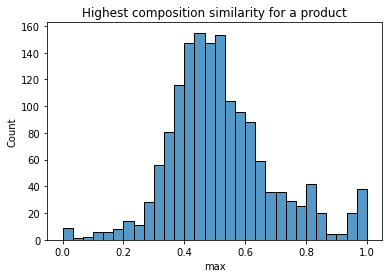

In [45]:
# Plot histogram distribution of the extent of product similarities
sns.histplot(summary['max'])
plt.title('Highest composition similarity for a product')


In [46]:
# Print commentary
print(r'On average, the highest similarity achieved between one product to another is {}%'.format(round(summary['max'].mean()*100,2)))

On average, the highest similarity achieved between one product to another is 52.05%


### Similar products by category

In [47]:
# Create a function to return a list of similar products by category
def list_sim_prod(category, num_pairs):
    s= list(matrix[matrix['category']==category].index)
    s_df = matrix.loc[s,s]
    return s_df.describe().T['max'].sort_values(ascending=False)[:num_pairs*2]

In [48]:
# Preview list of category
df['category'].value_counts()

Moisturizers & Creams         426
Face Serums                   269
Face Wash & Cleansers         188
Eye Creams & Treatments       168
Masks                         150
Sunscreen                      73
Lip Balms & Treatments         65
Exfoliators & Facial Peels     61
Toners                         61
Mists & Essences               54
Blemish & Acne Treatments      26
Name: category, dtype: int64

In [49]:
# Let's check the list of similar products for Toners
list_sim_prod('Masks', 20)

Dr. Barbara Sturm Face Mask                                             1.000000
Dr. Barbara Sturm Face Mask Sachet Box                                  1.000000
Charlotte Tilbury Mini Goddess Clay Mask 15ml Travel Size               0.974679
Charlotte Tilbury Goddess Clay Mask                                     0.974679
Farmacy Coconut Gel Sheet Mask - Brightening                            0.954169
Farmacy Coconut Gel Sheet Mask - Hydrating                              0.954169
Caudalie Purifying Mask                                                 0.864791
Caudalie Moisturizing Mask                                              0.864791
SEPHORA COLLECTION Hemp Mousse Mask - Anti-Blemish                      0.810108
SEPHORA COLLECTION Acai Smoothie Mask - Anti-Pollution                  0.810108
LANEIGE Lavender Water Sleeping Mask                                    0.777616
LANEIGE Water Sleeping Mask                                             0.777616
CLINIQUE Acne Solutions Oil-

# 6. Final Recommender System

Based on the exploratory analysis above, **Cosine Similarity** seems to be a better measure of how similar products are based on their ingredients. Unlike Cosine Similarity, Jaccard similarity does not consider term-frequencies as it is simply taking a ratio of intersection over the size of the union of two sets of ingredient-terms. In Jaccard similarity, words that neither products have are also not considered. Using vector spaces concept in Cosine similarity makes the similarity measure more complicated, but it has a major advantage: instead of looking at Yes/No ingredient-terms in products, ingredient-terms can be weight by importance with procedures like TF-IDF. 

In [50]:
# Source: http://www.statistics.cool/post/what-is-cosine-similarity-anyway/

## 6.1. Cosine Similarity 

In [51]:
# Compute pairwise similarity using cosine similarity
product_sim_matrix = pd.DataFrame(cosine_similarity(ingr_term_matrix_cvec))
product_sim_matrix.head()

0         1         2         3         4         5         6     \
0  1.000000  0.304290  0.336613  0.332039  0.264198  0.176777  0.304886   
1  0.304290  1.000000  0.494889  0.272798  0.263574  0.177512  0.391390   
2  0.336613  0.494889  1.000000  0.218390  0.415241  0.131538  0.473982   
3  0.332039  0.272798  0.218390  1.000000  0.211477  0.198101  0.234895   
4  0.264198  0.263574  0.415241  0.211477  1.000000  0.100080  0.368949   

       7         8         9         10        11        12        13    \
0  0.281091  0.240192  0.284004  0.000000  0.283463  0.440386  0.224525   
1  0.245374  0.109632  0.433333  0.000000  0.320222  0.422116  0.105409   
2  0.319339  0.229789  0.543408  0.092057  0.305085  0.509085  0.092057   
3  0.315000  0.209352  0.295531  0.000000  0.258097  0.431821  0.107833   
4  0.268543  0.217571  0.434122  0.098058  0.397187  0.261785  0.261488   

       14        15        16        17        18        19        20    \
0  0.309058  0.170020  0.272166  0.243931  0.290957  0.256718  0.157135   
1  0.326464  0.139686  0.251558  0.314929  0.478091  0.268438  0.279715   
2  0.485747  0.223653  0.244104  0.266704  0.469725  0.312581  0.275604   
3  0.272124  0.190530  0.285935  0.214780  0.264920  0.183073  0.176090   
4  0.292449  0.303204  0.312019  0.301844  0.315031  0.237826  0.400320   

       21        22        23        24        25        26        27    \
0  0.196116  0.188713  0.000000  0.264039  0.191273  0.253024  0.247720   
1  0.214834  0.418617  0.050000  0.338954  0.192068  0.188982  0.203523   
2  0.291857  0.306917  0.116445  0.442056  0.284649  0.220059  0.364602   
3  0.268612  0.211477  0.000000  0.184932  0.285795  0.180439  0.256249   
4  0.244264  0.365385  0.124035  0.302703  0.238231  0.093761  0.271857   

       28        29        30        31        32        33        34    \
0  0.137493  0.108866  0.340207  0.194444  0.209951  0.116690  0.232291   
1  0.161374  0.156525  0.251558  0.136931  0.305178  0.172567  0.337652   
2  0.319450  0.208302  0.227831  0.132874  0.355363  0.133963  0.376082   
3  0.264135  0.152499  0.152499  0.155643  0.126688  0.156920  0.140168   
4  0.280224  0.249615  0.173344  0.254762  0.197492  0.190261  0.182089   

       35        36        37        38        39        40        41    \
0  0.183494  0.340459  0.263718  0.132020  0.244412  0.201843  0.174964   
1  0.271360  0.279715  0.233333  0.244047  0.240966  0.211058  0.175691   
2  0.315984  0.275604  0.194074  0.221028  0.303974  0.175547  0.148787   
3  0.123377  0.146742  0.204598  0.147945  0.136948  0.082252  0.130713   
4  0.224387  0.133440  0.165380  0.269069  0.199254  0.149592  0.138675   

       42        43        44        45        46        47        48    \
0  0.184017  0.213844  0.120386  0.181848  0.167360  0.085010  0.124065   
1  0.094491  0.175691  0.148361  0.209165  0.200000  0.139686  0.114671   
2  0.154042  0.148787  0.134367  0.260958  0.189222  0.203321  0.252219   
3  0.077331  0.108928  0.089939  0.101892  0.204598  0.095265  0.139031   
4  0.117202  0.118864  0.061340  0.203844  0.279078  0.238231  0.173838   

       49        50        51        52        53        54        55    \
0  0.240563  0.151203  0.261891  0.266776  0.050540  0.141421  0.079399   
1  0.256935  0.223607  0.311990  0.297457  0.103807  0.206559  0.146774   
2  0.253158  0.173585  0.425933  0.346372  0.120877  0.210461  0.227880   
3  0.188707  0.237220  0.176090  0.085416  0.000000  0.158481  0.133465   
4  0.196116  0.277350  0.186816  0.213602  0.128757  0.256205  0.242734   

       56        57    58        59        60        61        62        63    \
0  0.125988  0.108866   0.0  0.161015  0.111111  0.110378  0.078567  0.228387   
1  0.086258  0.201246   0.0  0.188982  0.091287  0.217643  0.086066  0.187639   
2  0.160709  0.208302   0.0  0.264071  0.106299  0.274553  0.025055  0.252110   
3  0.094124  0.152499   0.0  0.206216  0.124515  0.123693  0.088045  0.2165

In [52]:
# Reset index
df.reset_index(drop=True, inplace=True)

In [53]:
# Create new dataframe with product name, category and ingredients (from the output matrix of the CountVectorizer)
product_sim_matrix = df[['product_name', 'category']].join(product_sim_matrix.copy())

In [54]:
# Create a mapping associating product name to index
index_product = dict(zip(df.index, df['product_name']))

# Uncomment below to check
#index_product

In [55]:
# Label the indexes
index_product['category']='category'
index_product['product_name']='product_name'

In [56]:
# Rename column names
product_sim_matrix.columns = product_sim_matrix.columns.map(index_product)
product_sim_matrix.rename(columns = {np.nan:'product_name'}, inplace = True)
product_sim_matrix.head()

product_name  \
0                     Algenist GENIUS Sleeping Collagen   
1                    Algenist Complete Eye Renewal Balm   
2         Algenist GENIUS Ultimate Anti-Aging Eye Cream   
3                   Algenist GENIUS Liquid Collagen Lip   
4  Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum   

                  category  Algenist GENIUS Sleeping Collagen  \
0    Moisturizers & Creams                           1.000000   
1  Eye Creams & Treatments                           0.304290   
2  Eye Creams & Treatments                           0.336613   
3   Lip Balms & Treatments                           0.332039   
4              Face Serums                           0.264198   

   Algenist Complete Eye Renewal Balm  \
0                            0.304290   
1                            1.000000   
2                            0.494889   
3                            0.272798   
4                            0.263574   

   Algenist GENIUS Ultimate Anti-Aging Eye Cream  \
0                                       0.336613   
1                                       0.494889   
2                                       1.000000   
3                                       0.218390   
4                                       0.415241   

   Algenist GENIUS Liquid Collagen Lip  \
0                             0.332039   
1                             0.272798   
2                             0.218390   
3                             1.000000   
4                             0.211477   

   Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum  \
0                                              0.264198   
1                                              0.263574   
2                                              0.415241   
3                                              0.211477   
4                                              1.000000   

   Algenist ALIVE Prebiotic Balancing Mask  \
0                                 0.176777   
1                                 0.177512   
2                                 0.131538   
3                                 0.198101   
4                                 0.100080   

   Algenist Overnight Restorative Cream  \
0                              0.304886   
1                              0.391390   
2                              0.473982   
3                              0.234895   
4                              0.368949   

   Algenist POWER Recharging Night Pressed Serum  \
0                                       0.281091   
1                                       0.245374   
2                                       0.319339   
3                                       0.315000   
4                                       0.268543   

   Algenist GENIUS Ultimate Anti-Aging Melting Cleanser  \
0                                              0.240192   
1                                              0.109632   
2                                              0.229789   
3                                              0.209352   
4                                              0.217571   

   Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum  \
0                                                0.284004   
1                                                0.433333   
2                                                0.543408   
3                                                0.295531   
4                                                0.434122   

   Algenist ELEVATE Firming & Lifting Neck Cream  \
0                                       0.000000   
1                                       0.000000   
2                                       0.092057   
3                                       0.000000   
4                                       0.098058   

   Algenist ELEVATE Advanced Retinol Serum  \
0                                 0.283463   
1                                 0.320222   
2                                 0.305085   
3                                 0.258097   
4              

In [57]:
# Change index to match the original 
product_sim_matrix.index =df.index
product_sim_matrix.index

RangeIndex(start=0, stop=1541, step=1)

In [58]:
# Save data
product_sim_matrix.to_csv('../data/cos_sim_matrix_withcategory.csv', index = True)  

Custom functions are created below for the final recommender system.

## 6.2. Query for Closest Product to a Selected Product

### What are the closest products to Product A in terms of similarity score?

In [59]:
# Create a function to return the n most similar products based on cosine similarity score
def closest_products(prod, num=3, match_category=False):
    '''
    INPUT:
    prod - name of the product to find closest products for
    num - number of products to return 
    match_category - whether to return only products of similar type (i.e. toner, facial cleanser, etc.); true to consider product category, false otherwise
    
    OUTPUT: 
    Returns x num of products that are most similar to the prod, including the similarity score
    '''
    results = product_sim_matrix[['product_name',prod]].sort_values(by=prod, ascending=False).head(num+1)
    
    if match_category==True:
        pcategory = product_sim_matrix[product_sim_matrix.product_name==prod].iloc[0]['category']
        results = product_sim_matrix.loc[product_sim_matrix.category==pcategory, ['product_name', prod]].sort_values(by=prod, ascending=False).head(num+1)
    return results

In [60]:
# Select some sample 'product_name' to test
for i in df.product_name.sample(5):
    print(i)

Edible Beauty Coco Bliss Intensive Repair
SOBEL SKIN Rx 27% Glycolic Acid Facial Cleanser
Perricone MD Multi-Action Overnight Intensive Firming Mask
Summer Fridays Overtime Mask
LANCER Skincare Soothe & Hydrate Serum with Hyaluronic Acid


In [61]:
# Let's check a particular product's cosine similarity against other products
closest_products('CLINIQUE Moisture Surge CC Cream Hydrating Colour Corrector Broad Spectrum SPF 30', 3, match_category=True)

,product_name,CLINIQUE Moisture Surge CC Cream Hydrating Colour Corrector Broad Spectrum SPF 30
219,CLINIQUE Moisture Surge CC Cream Hydrating Colour Corrector Broad Spectrum SPF 30,1.000000
264,CLINIQUE Age Defense BB Cream Broad Spectrum SPF 30,0.750000
1413,Smashbox Camera Ready BB Cream SPF 35,0.589165
117,Bobbi Brown Extra Illuminating Moisture Balm,0.503115


In [62]:
# Let's check a particular product's cosine similarity against other products
closest_products('IT Cosmetics Bye Bye Pores Leave-On Solution Pore-Refining Toner', 5, match_category=True)

,product_name,IT Cosmetics Bye Bye Pores Leave-On Solution Pore-Refining Toner
733,IT Cosmetics Bye Bye Pores Leave-On Solution Pore-Refining Toner,1.000000
829,Kiehl's Since 1851 Rare Earth Pore Refining Tonic,0.494451
1208,Peter Thomas Roth 8% Glycolic Solutions Toner,0.349250
608,GLAMGLOW SUPERTONER™ Exfoliating Acid Solution Toner,0.304800
122,Bobbi Brown Hydrating Face Tonic Toner,0.297842
970,Mario Badescu Buffering Lotion,0.296334


## 6.3. Query for Cosine Similarity Score of a Product to Another

### How similar is Product A to Product B?

In [63]:
# Create a function to return similarity scores between 2 products
def compare_ingr(prod1, prod2):
    sim = product_sim_matrix.loc[product_sim_matrix.product_name==prod1, ['product_name', prod2]]
    return sim

In [64]:
# Let's compare the similarity scores between 2 products
compare_ingr("Kiehl's Since 1851 Rare Earth Pore Refining Tonic",
             'IT Cosmetics Bye Bye Pores Leave-On Solution Pore-Refining Toner')

,product_name,IT Cosmetics Bye Bye Pores Leave-On Solution Pore-Refining Toner
829,Kiehl's Since 1851 Rare Earth Pore Refining Tonic,0.494451


## 6.4. Query for N Number of Products with Closest Cosine Similarity Score by Category 

### Similar products by category

In [65]:
# Preview list of category
df['category'].value_counts()

Moisturizers & Creams         426
Face Serums                   269
Face Wash & Cleansers         188
Eye Creams & Treatments       168
Masks                         150
Sunscreen                      73
Lip Balms & Treatments         65
Exfoliators & Facial Peels     61
Toners                         61
Mists & Essences               54
Blemish & Acne Treatments      26
Name: category, dtype: int64

In [66]:
# Set up summary statistics by category
summary_Moisturizers_Creams = matrix[matrix.category=='Moisturizers & Creams'].describe().T
summary_Face_Serums = matrix[matrix.category=='Face Serums'].describe().T
summary_Face_Wash_Cleansers = matrix[matrix.category=='Face Wash & Cleansers'].describe().T
summary_Eye_Creams_Treatments = matrix[matrix.category=='Eye Creams & Treatments'].describe().T
summary_Masks = matrix[matrix.category=='Masks'].describe().T
summary_Sunscreen = matrix[matrix.category=='Sunscreen'].describe().T
summary_Lip_Balms_Treatments = matrix[matrix.category=='Lip Balms & Treatments'].describe().T
summary_Exfoliators_Facial_Peels = matrix[matrix.category=='Exfoliators & Facial Peels'].describe().T
summary_Toners = matrix[matrix.category=='Toners'].describe().T
summary_Mists_Essences = matrix[matrix.category=='Mists & Essences'].describe().T
summary_Blemish_Acne_Treatments = matrix[matrix.category=='Blemish & Acne Treatments'].describe().T

In [67]:
# Create a function to return a list of similar products by category
def print_similar_prods(summarylist, threshold, num, match_category=False):
    '''
    print all the closest n products to the ones in the list 
    '''
    # Returns a list of products that are similar to the given product based on threshold
    prod_list = summarylist[summarylist['max']>threshold].index.tolist()
    
    # Prints number of products that are more than threshold
    print(f'{len(prod_list)} products \n')
    
    # For each of the similar products in the product list, prints selected number of similar products and their similarity
    for i in prod_list:
        print(i)
        for n in range(1,num+1):
            print(
                closest_products(i,num, match_category).values[n][0], ': ',
                round(closest_products(i,num, match_category).values[n][1],2)
                )
        print('\n')

In [68]:
print_similar_prods(summary_Moisturizers_Creams, 0, 3, False)

1523 products 

Algenist GENIUS Sleeping Collagen
Algenist GENIUS Collagen Calming Relief :  0.44
Kate Somerville +Retinol Vitamin C Moisturizer :  0.43
Peter Thomas Roth Water Drench® Hyaluronic Cloud Hydrating Eye Gel :  0.41


Algenist Complete Eye Renewal Balm
Algenist GENIUS Ultimate Anti-Aging Eye Cream :  0.49
Algenist Concentrated Reconstructing Serum :  0.48
Dermalogica Age Reversal Eye Complex :  0.47


Algenist GENIUS Ultimate Anti-Aging Eye Cream
Bobbi Brown Radiance Boost Walnut Grain & Orange Oil Exfoliating Face Mask :  0.55
Algenist POWER Advanced Wrinkle Fighter 360° Eye Serum :  0.54
LANCER Skincare Eye Contour Lifting Cream with Diamond Powder :  0.52


Algenist GENIUS Liquid Collagen Lip
L'Occitane Immortelle Reset Overnight Reset Oil-In Serum :  0.51
Algenist GENIUS Collagen Calming Relief :  0.43
L'Occitane Immortelle Overnight Reset Eye Serum :  0.34


Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum
The INKEY List Ceramide Hydrating Night Treatment :  0.52
B

alpyn beauty PlantGenius® Melt Moisturizer with Bakuchiol :  0.58
alpyn beauty PlantGenius® Line-Filling Eye Balm with Bakuchiol :  0.57
alpyn beauty PlantGenius® Creamy Bubbling Cleanser with Fruit Enzymes & AHAs :  0.41


alpyn beauty PlantGenius® Creamy Bubbling Cleanser with Fruit Enzymes & AHAs
alpyn beauty PlantGenius® Melt Moisturizer with Bakuchiol :  0.52
alpyn beauty PlantGenius® Line-Filling Eye Balm with Bakuchiol :  0.43
alpyn beauty PlantGenius® Brightening Survival Serum :  0.41


alpyn beauty PlantGenius® Line-Filling Eye Balm with Bakuchiol
alpyn beauty PlantGenius® Melt Moisturizer with Bakuchiol :  0.69
alpyn beauty PlantGenius® Brightening Survival Serum :  0.57
alpyn beauty PlantGenius® Creamy Bubbling Cleanser with Fruit Enzymes & AHAs :  0.43


alpyn beauty Calming Sleeping Mask with Melatonin & Wild Dandelion
alpyn beauty PlantGenius® Melt Moisturizer with Bakuchiol :  0.36
alpyn beauty PlantGenius® Line-Filling Eye Balm with Bakuchiol :  0.32
alpyn beauty Plant

belif Cleansing Gel Oil Enriched :  0.54
Shiseido White Lucent Brightening Cleansing Foam :  0.49


belif Peat Miracle Revital Serum Concentrate
belif Peat Miracle Revital Eye Cream :  0.66
belif Peat Miracle Revital Cream :  0.62
belif Aqua Bomb Mist :  0.55


belif Problem Solution Cleansing Foam
belif Problem Solution Toner :  0.63
belif Creamy Cleansing Foam Moist  :  0.62
belif Problem Solution Moisturizer :  0.58


belif The True Cream Aqua Bomb Deco
belif The True Cream Aqua Bomb Aloe Vera :  0.84
belif Youth Creator- Age Knockdown Bomb :  0.61
belif Milky Hydra Balancing Moisturizer  :  0.57


belif Youth Creator- Age Knockdown Bomb
belif The True Cream Aqua Bomb Deco :  0.61
belif The True Cream Aqua Bomb Aloe Vera :  0.58
belif Aqua Bomb Hydrating Toner :  0.54


belif The True Cream Aqua Bomb Aloe Vera
belif The True Cream Aqua Bomb Deco :  0.84
belif Youth Creator- Age Knockdown Bomb :  0.58
belif Milky Hydra Balancing Moisturizer  :  0.53


belif Milky Hydra Balancing Mois

Algenist Hydrating Essence Toner :  0.39
Wander Beauty Glow Getter Mist :  0.35
boscia Purifying Cleansing Gel :  0.33


boscia Resurfacing Treatment Toner with Apple Cider
StackedSkincare Hydrating Lip Peel :  0.47
SEPHORA COLLECTION Clear Skin Days by Sephora Collection Brightening Peel Pads :  0.43
Dr Roebuck's Lifesaver Skin Brightening Toner :  0.38


boscia Chia Seed Moisture Cream
SEPHORA COLLECTION Water Gel Mask Hydrate + Refresh :  0.44
boscia Peptide Trio Eye Cream :  0.44
Peter Thomas Roth Potent-C™ Vitamin C Power Serum :  0.44


boscia Rosehip Omega Face Oil
KORRES Wild Rose Spotless Serum with 15% Vitamin Super C :  0.27
Origins Dr. Andrew Weil For Origins™ Mega Defense Barrier-Boosting Essence Oil :  0.26
KORRES Wild Rose Brightening Absolute Oil :  0.24


boscia Skin Perfecting BB Cream Broad Spectrum SPF 30
tarte BB Tinted Treatment 12-Hour Primer Broad Spectrum SPF 30 Sunscreen :  0.5
SOBEL SKIN Rx Plant Stem Cell Day Cream SPF 30 :  0.44
COOLA Daydream™ Mineral Prim

Perricone MD Vitamin C Ester Citrus Brightening Cleanser :  0.28


Clarins Extra-Firming Wrinkle Control Regenerating Night Cream
Clarins Extra-Firming Wrinkle Control Firming Day Cream SPF 15 :  0.62
Clarins Hydra-Essentiel Rich Cream - Very Dry Skin :  0.6
Clarins Hydra-Essentiel Silky Cream - Normal to Dry Skin :  0.6


Clarins Super Restorative Total Eye Concentrate
Bobbi Brown Radiance Boost Walnut Grain & Orange Oil Exfoliating Face Mask :  0.51
Clarins Extra-Firming Eye :  0.51
Clarins Hydra-Essentiel Rich Cream - Very Dry Skin :  0.49


Clarins Sunscreen Multi-Protection Broad Spectrum SPF 50
Clarins UV PLUS Anti-Pollution Sunscreen Multi-Protection Tint SPF 50 :  0.84
Clarins Multi-Active Day Cream SPF 20 - All Skin Types :  0.47
Murad City Skin Age Defense Broad Spectrum SPF 50 PA++++ :  0.47


Clarins Multi-Active Night Cream - Normal to Combination Skin
Clarins Multi Active Day Cream - All Skin Types :  0.57
Clarins Multi-Active Day Cream-Gel - Normal to Combination Skin : 

Smashbox Camera Ready BB Cream SPF 35 :  0.59
First Aid Beauty FAB Skin Lab Retinol Eye Cream with Triple Hyaluronic Acid :  0.52


CLINIQUE Acne Solutions Clarifying Lotion
CLINIQUE Acne Solutions Cleansing Foam :  0.54
CLINIQUE Acne Solutions™ Cleansing Gel :  0.45
CLINIQUE Blackhead Solutions 7 Day Deep Pore Cleanse & Scrub :  0.41


CLINIQUE Blackhead Solutions 7 Day Deep Pore Cleanse & Scrub
CLINIQUE City Block Purifying Charcoal Clay Mask + Scrub :  0.73
CLINIQUE Acne Solutions Oil-Control Cleansing Mask :  0.63
CLINIQUE Acne Solutions™ Cleansing Gel :  0.48


CLINIQUE Acne Solutions™ BB Cream SPF 40
CLINIQUE Moisture Surge CC Cream Hydrating Colour Corrector Broad Spectrum SPF 30 :  0.49
Dr. Jart+ Dis-A-Pore Beauty Balm SPF 50+ :  0.49
CLINIQUE Superdefense City Block SPF 50+ Daily Energy + Face Protector :  0.49


CLINIQUE Pep-Start 2-in-1 Exfoliating Cleanser
CLINIQUE Acne Solutions™ Cleansing Gel :  0.6
Origins GinZing™ Refreshing Scrub Cleanser :  0.47
The INKEY List Hyaluro

CLINIQUE Acne Solutions Cleansing Foam :  0.49
CLINIQUE Blackhead Solutions 7 Day Deep Pore Cleanse & Scrub :  0.48


CLINIQUE Smart Broad Spectrum SPF 15 Custom-Repair Moisturizer for Dry Combination Skin
CLINIQUE Smart Broad Spectrum SPF 15 Custom-Repair Moisturizer for Very Dry to Dry Skin :  0.78
CLINIQUE Smart Night™ Custom-Repair Moisturizer - Dry Combination :  0.67
CLINIQUE Smart Night Custom-Repair Moisturizer - Very Dry to Dry :  0.66


CLINIQUE Repairwear™ Intensive Lip Treatment
La Mer The Lip Volumizer :  0.47
CLINIQUE City Block Sheer Oil-Free Daily Face Protector SPF 25 :  0.39
CLINIQUE Repairwear Laser Focus Line Smoothing Cream Broad Spectrum SPF 15 for Very Dry to Dry Combination Skin :  0.39


CLINIQUE Superdefense City Block SPF 50+ Daily Energy + Face Protector
CLINIQUE Broad Spectrum SPF 30 Mineral Sunscreen Lotion for Body :  0.75
CLINIQUE Pep-Start Daily UV Protector Broad Spectrum SPF 50 :  0.62
CLINIQUE Broad Spectrum SPF 50 Mineral Sunscreen Fluid for Face : 

COOLA Mineral Sunscreen Spray SPF 30 :  0.5
COOLA Full Spectrum 360°  Mineral Sun Silk Moisturizer Organic Sunscreen SPF 30 :  0.41


COOLA Liplux SPF 30
Moroccanoil Sun Oil 15 SPF :  0.34
Kopari Coconut Lip Glossy :  0.32
Jack Black Intense Therapy Lip Balm SPF 25 :  0.31


COOLA Mineral Face Organic Matte Finish Sunscreen Lotion SPF 30
COOLA Mineral Face Organic Matte Tint Sunscreen Lotion SPF 30 :  0.97
COOLA Classic Face Sunscreen SPF 50 White Tea :  0.32
Biossance Squalane + Tea Tree Balancing Oil :  0.31


COOLA ER+ Radical Recovery After-Sun Lotion
Skinfix Barrier+ Triple Lipid-Boost 360° Eye Cream :  0.35
REN Clean Skincare ClearCalm 3 Clarifying Clay Cleanser :  0.34
LANCER Skincare Caviar Lime Acid Peel :  0.33


COOLA Daydream™ Mineral Primer SPF 30
tarte BB Tinted Treatment 12-Hour Primer Broad Spectrum SPF 30 Sunscreen :  0.61
bareMinerals Prime Time™  BB Tinted Primer Broad Spectrum SPF 30 :  0.49
boscia Skin Perfecting BB Cream Broad Spectrum SPF 30 :  0.43


COOLA Miner

Guerlain Abeille Royale Day Cream :  0.56
Dior Capture Totale Multi-Perfection Creme :  0.55
Dior Capture Youth Matte Maximizer Age-Delay Mattifying Serum :  0.54


Dior Capture Totale Intensive Night Restorative Crème
Dior Capture Totale Multi-Perfection Creme :  0.61
Dior One Essential Eye Serum :  0.51
Dior Capture Totale C.E.L.L. ENERGY - Firming & Wrinkle-Correcting Crème :  0.5


Dior Hydra Life Glow Better Fresh Jelly Mask
Farmacy Bright On Massage-Activated Vitamin C Mask :  0.12
Tatcha Violet-C Radiance Mask :  0.12
Summer Fridays Overtime Mask :  0.07


Dior Capture Totale C.E.L.L. ENERGY - Firming & Wrinkle-Correcting Eye Cream
Dior Capture Totale C.E.L.L. ENERGY - Firming & Wrinkle-Correcting Crème :  0.59
Dior Capture Totale Multi-Perfection Creme :  0.53
Fresh Black Tea Corset Cream Firming Moisturizer :  0.48


Dior Capture Totale C.E.L.L. ENERGY - Firming & Wrinkle-Correcting Crème
Dior Capture Totale C.E.L.L. ENERGY - Firming & Wrinkle-Correcting Eye Cream :  0.59
Dior

CLINIQUE Moisture Surge CC Cream Hydrating Colour Corrector Broad Spectrum SPF 30 :  0.46
Charlotte Tilbury Goddess Clay Mask :  0.42


Dr. Barbara Sturm Face Mask Sachet Box
Dr. Barbara Sturm Face Mask Sachet Box :  1.0
Proactiv Skin Smoothing Exfoliator :  0.4
Kiehl's Since 1851 Rare Earth Deep Pore Daily Cleanser :  0.4


Dr. Barbara Sturm Clarifying Acne Spot Treatment
Dr. Barbara Sturm Hydrating Face Mist :  0.32
philosophy Purity Made Simple Hydra-Essence with Coconut Water :  0.29
Dermalogica Biolumin-C Vitamin C Eye Serum :  0.29


Dr. Barbara Sturm Darker Skin Tones Enzyme Cleanser
Dr. Barbara Sturm Enzyme Cleanser :  1.0
The Ordinary 100% L-Ascorbic Acid Powder :  0.3
Dior Hydra Life Time to Glow Ultra Fine Exfoliating Powder :  0.24


Dr. Barbara Sturm Lip Balm
Kopari Coconut Lip Scrubby :  0.3
Edible Beauty Coco Bliss Intensive Repair :  0.28
Kiehl's Since 1851 Love Oil For Lips Glow-Infusing Lip Treatment :  0.28


Dr. Barbara Sturm Hydrating Face Mist
Dr. Barbara Sturm Da

Dr. Dennis Gross Skincare Stress Repair Face Cream with Niacinamide :  0.83
Dr. Dennis Gross Skincare Stress SOS Eye Cream™ with Niacinamide :  0.45
First Aid Beauty Ultra Repair Oil-Control Moisturizer :  0.32


Dr. Dennis Gross Skincare Alpha Beta® Exfoliating Moisturizer
Dr. Dennis Gross Skincare Clinical Grade Resurfacing Liquid Peel :  0.37
Dr. Dennis Gross Skincare Alpha Beta® Pore Perfecting & Refining Serum :  0.36
Glow Recipe Avocado Melt Retinol Sleeping Face Mask :  0.35


Dr. Dennis Gross Skincare Hyaluronic Marine Hydration Booster
Dr. Dennis Gross Skincare Clinical Concentrate Radiance Booster™  :  0.47
Kate Somerville Kx Active Concentrates Ceramides + Omegas Serum :  0.45
SUNDAY RILEY ICE Ceramide Moisturizing Cream :  0.41


Dr. Dennis Gross Skincare Clinical Grade IPL Dark Spot Correcting Serum
Dr. Dennis Gross Skincare Ferulic + Retinol Triple Correction Eye Serum :  0.47
Dr. Dennis Gross Skincare Alpha Beta® Pore Perfecting & Refining Serum :  0.36
Dr. Dennis Gross 

Peter Thomas Roth Water Drench® Hyaluronic Cloud Hydrating Eye Gel :  0.46
Dr. Dennis Gross Skincare Vitamin C+ Collagen Brighten & Firm Eye Cream :  0.46
Drunk Elephant Shaba Complex™ Firming Eye Serum :  0.46


Drunk Elephant D-Bronzi™ Anti-Pollution Sunshine Drops
Drunk Elephant C-Firma™ Vitamin C Day Serum :  0.37
GLAMGLOW GLOWSTARTER™ Mega Illuminating Moisturizer :  0.37
Origins  Hello Calm™ Relaxing & Hydrating Face Mask with Hemp Seed Oil :  0.36


Drunk Elephant F-Balm™ Electrolyte Waterfacial Mask
IT Cosmetics Confidence in a Gel Lotion :  0.57
Lord Jones Acid Mantle Repair Moisturizer With 250mg CBD and Ceramides :  0.57
Drunk Elephant Lala Retro™ Whipped Moisturizer with Ceramides :  0.52


Drunk Elephant Shaba Complex™ Firming Eye Serum
Drunk Elephant C-Tango™ Multivitamin Eye Cream :  0.46
The Ordinary "Buffet" + Copper Peptides 1% :  0.4
SOBEL SKIN Rx Oligo Peptide Eye Cream :  0.4


Drunk Elephant Umbra™ Sheer Physical Daily Defense Broad Spectrum Sunscreen SPF 30
Drunk

CLINIQUE Smart Night™ Custom-Repair Moisturizer - Dry Combination :  0.48
CLINIQUE Clinique Smart Clinical™ MD Multi-Dimensional Age Transformer Duo Resculpt + Revolumize :  0.47
CLINIQUE Smart Night Custom-Repair Moisturizer - Very Dry to Dry :  0.45


Estée Lauder Perfectly Clean Multi-Action Toning Lotion/Refiner 
CLINIQUE Moisture Surge™ Hydrating Lotion :  0.45
Origins Maskimizer™ Skin-Optimizing Mask Primer :  0.42
Erno Laszlo Multi-Task Eye Serum Mask :  0.41


Estée Lauder DayWear Eye Cooling Anti-Oxidant Moisture GelCreme
Estée Lauder DayWear Matte Oil-Control Anti-Oxidant Moisture Gel Creme :  0.51
Estée Lauder NightWear Plus Anti-Oxidant Night Detox Creme :  0.45
Estée Lauder Perfectionist Pro Rapid Brightening Treatment with Ferment2 + Vitamin C :  0.39


Estée Lauder Advanced Time Zone Age Reversing Line/Wrinkle Eye Creme
Estée Lauder Advanced Time Zone Night Age Reversing Line/Wrinkle Crème :  0.63
Estée Lauder Advanced Time Zone SPF 15- Normal/Combination Skin :  0.55
GL

Guerlain Abeille Royale Anti-Aging Eye Cream :  0.31


Farmacy Daily Greens Oil-Free Gel Moisturizer with Moringa and Papaya
Fresh Lotus Youth Preserve Eye Cream :  0.34
Primera Miracle Seed Essence :  0.34
The INKEY List Multi-Biotic Balancing Moisturizer  :  0.32


FARSÁLI Liquid Powder Oil Balancing Serum
tarte SEA Set & Protect Mineral Sunscreen Powder Broad Spectrum SPF 30 :  0.3
tarte Tarteguard Mineral Powder Sunscreen Broad Spectrum SPF 30 :  0.3
Dr Roebuck's Lifesaver Skin Brightening Toner :  0.28


FARSÁLI Rose Gold Elixir 24K Moisturizing Gel Cream
Dermalogica Sound Sleep Cocoon Night Gel-Cream :  0.41
Lancôme Rénergie Lift Multi-Action Lifting and Firming Moisturizer Light Cream :  0.37
Fresh Moisturizing Hand Cream :  0.37


FARSÁLI Haldi Eyes Brightening Turmeric Eye Cream
Perricone MD PRE:EMPT SERIES™ Brightening Eye Cream :  0.52
Eve Lom Radiance Antioxidant Eye Cream :  0.46
Algenist Complete Eye Renewal Balm :  0.45


FARSÁLI Mini Liquid Glass Radiance Serum
Volition

Fresh Umbrian Clay Mattifying Serum :  0.51
Dior Capture Totale Intensive Night Restorative Crème :  0.47
Guerlain Super Aqua-Serum :  0.44


Fresh Crème Ancienne® Eye Cream
Fresh Crème Ancienne® Infusion Toner :  0.43
Dermalogica Skin Resurfacing Cleanser :  0.32
Fresh Umbrian Clay Mattifying Serum :  0.29


Fresh Lotus Eye Gel
Fresh FreshFace Instant Glow Luminizer :  0.37
Dermalogica MultiVitamin Power Firm Eye Cream :  0.32
Fresh Lotus Youth Preserve Radiance Lotion :  0.32


Fresh Sugar Lip Serum Advanced Therapy
Fresh Sugar Wonder Drops Lip Primer :  0.51
Fresh Vitamin C Glow Moisturizer :  0.47
Fresh Lotus Youth Preserve Radiance Lotion :  0.43


Fresh Sugar Lemon Hydrating Lip Balm
Fresh Coconut Hydrating Lip Balm :  1.0
Fresh Sugar Peach Hydrating Lip Balm :  1.0
Fresh Sugar Cream Tinted Lip Treatment :  0.56


Fresh Sugar Peach Hydrating Lip Balm
Fresh Coconut Hydrating Lip Balm :  1.0
Fresh Sugar Peach Hydrating Lip Balm :  1.0
Fresh Sugar Cream Tinted Lip Treatment :  0.56


Guerlain Abeille Royale Night Cream :  0.65
Dior Capture Youth Age-Delay Advanced Crème :  0.56
Guerlain Abeille Royale Anti-Aging Eye Cream :  0.55


Guerlain Super Aqua-Serum
Fresh Moisturizing Hand Cream :  0.52
Dior Capture Totale Multi-Perfection Creme :  0.49
Fresh Black Tea Corset Cream Firming Moisturizer :  0.48


Herbivore Blue Tansy Fruit Enzyme Resurfacing Clarity Mask
Herbivore Jasmine Green Tea Balancing Toner :  0.19
Herbivore Prism 20% AHA + 5% BHA Exfoliating Glow Facial :  0.18
Kiehl's Since 1851 Rare Earth Deep Pore Daily Cleanser :  0.17


Herbivore Emerald CBD + Adaptogens Deep Moisture Glow Oil
Herbivore Emerald Hemp Seed Deep Moisture Glow Oil :  0.61
Peter Thomas Roth Green Releaf Therapeutic Sleep Cream :  0.34
Flora + Bast Age Adapting CBD Serum :  0.32


Herbivore Prism 20% AHA + 5% BHA Exfoliating Glow Facial
Herbivore Prism 12% AHA + 3% BHA Exfoliating Glow Serum :  0.82
The INKEY List Alpha Hydroxy Acid Serum :  0.39
Biossance Squalane + Glycolic Renewal M

The INKEY List Caffeine Eye Cream :  0.46


The INKEY List Bakuchiol Retinol Alternative Moisturizer
The INKEY List Retinol Anti-Aging Serum :  0.45
The INKEY List Hepta-Peptide Anti-Aging Serum :  0.44
SEPHORA COLLECTION Oat Muesli Mask - Soothing :  0.44


The INKEY List Kaolin Mask
The INKEY List Vitamin B, C, and E Moisturizer :  0.6
The INKEY List Peptide Moisturizer :  0.5
The INKEY List Retinol Eye Cream :  0.47


The INKEY List Ceramide Hydrating Night Treatment
Algenist GENIUS Ultimate Anti-Aging Foaming Cleanser :  0.56
Perricone MD H2 Elemental Energy Hydrating Cloud Cream :  0.54
Algenist GENIUS Ultimate Anti-Aging Vitamin C+ Serum :  0.52


The INKEY List Alpha Arbutin Brightening Serum
The INKEY List Retinol Anti-Aging Serum :  0.65
The INKEY List Q10 Antioxidant Serum :  0.62
The INKEY List Niacinamide Oil Control Serum :  0.59


The INKEY List Polyglutamic Acid Hydrating Serum
philosophy Ultimate Miracle Worker Fix Facial Serum Roller :  0.46
Kate Somerville Wrinkle War

AMOREPACIFIC Botanical Radiance Oil :  0.27
Herbivore Jasmine Green Tea Balancing Toner :  0.26


innisfree Green Tea Moisture-Balancing Cream
innisfree Green Tea Seed Intensive Hydrating Eye Cream :  0.72
innisfree Green Tea Moisture-Balancing Emulsion :  0.59
innisfree Orchid Youth-Enriched Eye Cream :  0.55


innisfree Cica Balm with Bija Seed Oil
innisfree Tangerine Brightening & Pore-Refining Sleeping Mask :  0.47
innisfree Tangerine Brightening & Pore-Refining Moisturizer :  0.47
innisfree Green Tea Seed Intensive Hydrating Serum :  0.46


innisfree Green Tea Moisture-Balancing Emulsion
innisfree Green Tea Moisture-Balancing Cream :  0.59
innisfree Green Tea Hydrating Cleansing Oil :  0.53
innisfree Green Tea Moisture-Balancing Toner :  0.5


innisfree Tangerine Brightening & Pore-Refining Moisturizer
innisfree Tangerine Brightening & Pore-Refining Sleeping Mask :  0.68
innisfree Orchid Youth-Enriched Eye Cream :  0.6
innisfree Green Tea Seed Intensive Hydrating Roll-On Eye Serum

philosophy Purity Made Simple Ultra-Light Moisturizer :  0.47


Kate Somerville Age Arrest Anti-Wrinkle Cream
Kate Somerville Age Arrest Eye Cream :  0.65
Kate Somerville +Retinol Vitamin C Moisturizer :  0.56
Bobbi Brown Radiance Boost Walnut Grain & Orange Oil Exfoliating Face Mask :  0.43


Kate Somerville D-Scar™ Scar Diminishing Serum
Lancôme Advanced Génifique Yeux Light-Pearl™ Eye Illuminator Youth Activating Concentrate :  0.51
LANEIGE Mini Pore Blur Perfector :  0.48
IT Cosmetics Bye Bye Redness Neutralizing Color-Correcting Cream :  0.47


Kate Somerville EradiKate® Salicylic Acid Acne Treatment
Kate Somerville EradiKate™ Mask Foam-Activated Acne Treatment :  0.46
Kate Somerville EradiKate® Daily Cleanser Acne Treatment :  0.45
Kate Somerville +Retinol Vitamin C Moisturizer :  0.43


Kate Somerville Goat Milk Moisturizing Cleanser
Clarins Extra-Firming Neck & Décolleté Cream :  0.38
Skinfix Correct+™ Dark Spot Corrector :  0.38
Kate Somerville +Retinol Vitamin C Moisturizer :

Lancôme Miel-En-Mousse Foaming Cleansing Makeup Remover with Acacia Honey :  0.5
Kiehl's Since 1851 Blue Herbal Acne Cleanser Treatment :  0.49


Kiehl's Since 1851 Dermatologist Solutions™ Centella Sensitive Facial Cleanser
Alpha-H Balancing Cleanser :  0.33
Primera Gentle Comfort Gel Cleanser for Sensitive Skin :  0.33
Kiehl's Since 1851 Dermatologist Solutions™ Centella Sensitive Cica-Cream :  0.32


Kiehl's Since 1851 Kiehl's Lip Balm #1
Kiehl's Since 1851 Super Fluid UV Mineral Defense Titanium Dioxide Sunscreen Broad Spectrum SPF 50+ :  0.58
The Ordinary 100% Plant-Derived Squalane :  0.58
boscia Vitamin B12 Hydration Booster Serum :  0.38


Kiehl's Since 1851 Ginger Leaf & Hibiscus Firming Mask
Farmacy Dew It All Total Eye Cream :  0.38
Clarins Hydra-Essentiel Rich Cream - Very Dry Skin :  0.36
Clarins Hydra-Essentiel Silky Cream - Normal to Dry Skin :  0.36


Kiehl's Since 1851 Clearly Corrective™ Brightening & Exfoliating Daily Cleanser
Kiehl's Since 1851 Clearly Corrective™ B

The INKEY List Kaolin Mask :  0.44


KORA Organics Balancing Rose Mist
Herbivore Rose Hibiscus Hydrating Mist :  0.39
Edible Beauty & Sleeping Beauty Purifying Mousse - Pink Clay Sleep Mask :  0.34
KORRES Wild Rose Brightening Absolute Oil :  0.32


KORA Organics Noni Lip Tint
KORA Organics Noni Lip Treatment :  0.81
Farmacy Honey Savior All-in-One Skin Repair Salve :  0.27
KORA Organics Noni Glow Face Balm :  0.27


KORA Organics Cream Cleanser for Dry Skin
KORA Organics Gentle Cleanser for Sensitive Skin :  0.8
KORA Organics Hydrating Moisturizer for Dry Skin :  0.63
The INKEY List Kaolin Mask :  0.41


KORA Organics Noni Glow Face Balm
Sol de Janeiro Brazilian Kiss Cupuaçu Lip Butter :  0.33
Edible Beauty & Sleeping Beauty Purifying Mousse - Pink Clay Sleep Mask :  0.32
KORA Organics Balancing Rose Mist :  0.32


KORA Organics Noni Lip Treatment
KORA Organics Noni Lip Tint :  0.81
Farmacy Honey Savior All-in-One Skin Repair Salve :  0.29
KORA Organics Noni Glow Face Balm :  0.29


K

Murad Essential-C Day Moisture Broad Spectrum SPF 30 PA+++ :  0.39


LANCER Skincare Omega Hydrating Oil
Farmacy Sleep Tight Firming Night Balm :  0.29
GLAMGLOW STARPOTION™ Liquid Charcoal Clarifying Oil :  0.29
Biossance Squalane + Tea Tree Balancing Oil :  0.29


LANCER Skincare Retexturizing Treatment Cream with Glycolic Acid 10x
Peter Thomas Roth 10% Glycolic Solutions Moisturizer :  0.52
First Aid Beauty Ultra Repair Cream Rosemary Mint :  0.44
Alpha-H Liquid Gold Ultimate Perfecting Mask :  0.44


LANCER Skincare The Method: Nourish Oily-Congested Skin
Kiehl's Since 1851 Dermatologist Solutions™ Centella Sensitive Cica-Cream :  0.44
LANCER Skincare Intensive Night Treatment with Hylaplex® and Marula Oil :  0.44
Algenist POWER Advanced Wrinkle Fighter Moisturizer :  0.43


LANCER Skincare The Method: Cleanse Blemish Control
LANCER Skincare The Method: Polish Oily-Congested Skin :  0.96
LANCER Skincare The Method: Cleanse :  0.45
Kate Somerville Gentle Daily Wash :  0.36


LANCER S

innisfree Green Tea Seed Intensive Hydrating Roll-On Eye Serum :  0.47


LANEIGE Water Bank Hydro Gel
LANEIGE Water Bank Moisture Cream :  1.0
LANEIGE Water Bank Hydro Essence :  0.69
innisfree Green Tea Seed Intensive Hydrating Roll-On Eye Serum :  0.47


LANEIGE Eye Sleeping Mask
LANEIGE Water Bank Hydro Essence :  0.55
LANEIGE Water Bank Eye Gel :  0.51
LANEIGE Essential Power Skin Toner for Combination to Oily Skin :  0.51


LANEIGE Lavender Water Sleeping Mask
LANEIGE Water Sleeping Mask :  0.78
LANEIGE Water Bank Eye Gel :  0.52
LANEIGE Water Bank Hydro Essence :  0.49


LANEIGE Water Bank Hydro Essence
LANEIGE Water Bank Moisture Cream :  0.69
LANEIGE Water Bank Hydro Gel :  0.69
LANEIGE Eye Sleeping Mask :  0.55


LANEIGE Water Bank Eye Gel
LANEIGE Water Sleeping Mask :  0.54
innisfree Tangerine Brightening & Pore-Refining Sleeping Mask :  0.52
LANEIGE Lavender Water Sleeping Mask :  0.52


LANEIGE Essential Power Skin Toner for Normal to Dry Skin
LANEIGE Essential Power Skin T

CLINIQUE Dramatically Different™ Moisturizing BB-gel :  0.39


Murad Retinol Youth Renewal Night Cream
Murad Renewing Eye Cream :  0.5
philosophy Ultimate Miracle Worker Fix Eye Power-Treatment :  0.5
Murad Retinol Youth Renewal Eye Serum :  0.47


Murad Advanced Active Radiance® Serum
Murad Advanced Acne & Wrinkle Reducer :  0.45
Murad Outsmart Acne Clarifying Treatment :  0.43
Murad Anti-Aging Moisturizer SPF 30 PA+++ :  0.41


Murad Time Release Acne Cleanser
Murad Hydro-Dynamic® Ultimate Moisture For Eyes :  0.54
Murad Advanced Acne & Wrinkle Reducer :  0.48
Bobbi Brown Radiance Boost Walnut Grain & Orange Oil Exfoliating Face Mask :  0.46


Murad InvisiScar Resurfacing Treatment
Omorovicza Refining Facial Polisher :  0.28
Shiseido White Lucent Anti-Dark Circles Eye Cream :  0.27
Kiehl's Since 1851 Clearly Corrective™ Brightening & Soothing Treatment Water :  0.26


Murad Nutrient-Charged Water Gel
Saturday Skin Pore Clarifying Toner 10% Glycolic Acid + Pore Control Complex :  0.58

Naturally Serious Supercharge Anti-Oxidant Moisture Serum :  0.67
Naturally Serious Lip Service 3-In-1 Lip Serum :  0.59
Naturally Serious Skin Warrior Anti-Pollution Repair Cream :  0.21


Naturally Serious Zero Baggage Anti-Dark Circle Eye Cream
Naturally Serious Skin Warrior Anti-Pollution Repair Cream :  0.62
Naturally Serious Major Moisture Gentle Cream Cleanser :  0.54
Naturally Serious Fruit-Tox Resurfacing Facial Remedy :  0.48


Naturally Serious Fruit-Tox Resurfacing Facial Remedy
Naturally Serious After-Dark Natural Peptide Sleeping Cream :  0.55
Naturally Serious Zero Baggage Anti-Dark Circle Eye Cream :  0.48
Naturally Serious Skin Warrior Anti-Pollution Repair Cream :  0.46


Naturally Serious Mineral Sun Defense Moisturizer Broad Spectrum Sunscreen SPF 30
Naturally Serious Skin Warrior Anti-Pollution Repair Cream :  0.41
Naturally Serious After-Dark Natural Peptide Sleeping Cream :  0.4
Naturally Serious Major Moisture Gentle Cream Cleanser :  0.4


Naturally Serious Lip

The INKEY List Glycolic Acid Exfoliating Toner :  0.4


The Ordinary "Buffet" + Copper Peptides 1%
The Ordinary Marine Hyaluronics :  0.55
The Ordinary 100% Plant-Derived Hemi-Squalane :  0.55
Algenist GENIUS Ultimate Anti-Aging Foaming Cleanser :  0.54


The Ordinary Azelaic Acid Suspension 10%
Dermalogica Sound Sleep Cocoon Night Gel-Cream :  0.39
The INKEY List Polyglutamic Acid Hydrating Serum :  0.37
The Ordinary Argireline Solution 10% :  0.37


The Ordinary Retinol 0.5% in Squalane
The Ordinary Retinol 0.2% in Squalane :  1.0
The Ordinary "B" Oil :  0.49
KORA Organics Noni Radiant Eye Oil :  0.35


The Ordinary 100% Plant-Derived Squalane
Kiehl's Since 1851 Kiehl's Lip Balm #1 :  0.58
Biossance Squalane + Vitamin C Rose Mask :  0.5
Kopari Coconut Lip Glossy :  0.47


The Ordinary Ascorbic Acid 8% + Alpha Arbutin 2%
The Ordinary Ethylated Ascorbic Acid 15% Solution :  0.71
The Ordinary 100% L-Ascorbic Acid Powder :  0.5
Obagi Clinical Vitamin C+ Arbutin Brightening Serum :  0.49


Origins Clear Improvement™ Charcoal Honey Mask to Purify and Nourish :  0.34


Origins Modern Friction™ Nature’s Gentle Dermabrasion
Bobbi Brown Hydrating Face Tonic Toner :  0.39
LANCER Skincare The Method: Polish Oily-Congested Skin :  0.36
LANCER Skincare The Method: Cleanse :  0.36


Origins Plantscription™ SPF 25 Power Anti-Aging Oil-Free Cream
Origins Plantscription™ SPF 25 Power Anti-Aging Cream :  0.98
Origins Plantscription™ Youth-Renewing Power Night Cream :  0.71
Lab Series For Men Day Rescue Defense Lotion SPF 35 :  0.6


Origins Peace Of Mind™ On-the-Spot Relief
Origins Plantscription™ Powerful Lifting Concentrate :  0.44
BECCA Skin Love Glow Elixir :  0.44
Origins Plantscription™ Powerful Lifting Cream :  0.44


Origins Plantscription™ Anti-Aging Power Eye Cream
Origins Plantscription™ Youth-Renewing Power Night Cream :  0.6
Origins Plantscription™ SPF 25 Power Anti-Aging Cream :  0.58
Origins Plantscription™ SPF 25 Power Anti-Aging Oil-Free Cream :  0.56


Origins United

Perricone MD Vitamin C Ester Brightening Overnight Treatment :  0.55


Perricone MD Essential Fx Acyl-Glutathione Smoothing & Brightening Under-Eye Cream
Perricone MD Essential Fx Acyl-Glutathione Rejuvenating Moisturizer :  0.59
Perricone MD Essential Fx Acyl-Glutathione Eyelid Lift Serum :  0.54
Perricone MD Essential Fx Acyl-Glutathione Intensive Overnight Moisturizer :  0.51


Perricone MD Vitamin C Ester Brightening Overnight Treatment
Perricone MD Vitamin C Ester Brightening Amine Face Lift :  0.64
Perricone MD High Potency Classics: Face Firming Serum :  0.55
Peter Thomas Roth Potent-C™ Vitamin C Targeted Spot Brightener :  0.49


Perricone MD Vitamin C Ester Brightening Amine Face Lift
Perricone MD Vitamin C Ester Brightening Overnight Treatment :  0.64
Perricone MD High Potency Classics: Face Firming Serum :  0.61
Perricone MD Cold Plasma+ Eye :  0.54


Perricone MD Cold Plasma+ Eye
Perricone MD Hypoallergenic Firming Eye Cream :  0.54
Perricone MD Vitamin C Ester Brightening 

The INKEY List Apple Cider Vinegar Peel :  0.37


Peter Thomas Roth 3% Glycolic Solutions Cleanser
Peter Thomas Roth Acne Clearing Wash :  0.63
SOBEL SKIN Rx 27% Glycolic Acid Facial Cleanser :  0.53
Clarisonic Skincare Pore & Blemish Acne Cleanser :  0.49


Peter Thomas Roth PRO Strength Exfoliating Super Peel
SEPHORA COLLECTION Clear Skin Days by Sephora Collection Clarifying Serum :  0.59
SEPHORA COLLECTION Clear Skin Days by Sephora Collection Brightening Peel Pads :  0.47
Indie Lee Clearing Mask :  0.41


Peter Thomas Roth Vital-E™ Microbiome Age Defense Cream
Peter Thomas Roth Vital-E™ Microbiome Age Defense Eye Cream :  0.92
BeautyBio The ZenBubble Gel Cream :  0.41
philosophy Renewed Hope in a Jar Skin Tint :  0.37


Peter Thomas Roth Max Sheer All Day Moisture Defense Lotion SPF 30 Sunscreen Lotion
Kiehl's Since 1851 Dermatologist Solutions™ Centella Sensitive Cica-Cream :  0.51
Peter Thomas Roth Instant FIRMx Eye™ :  0.44
Lancôme Renergie Lift Multi-Action Ultra Firming and D

Primera Alpine Berry Water Oil-Free Gel Moisturizer :  0.48
Primera Wild Seed Firming Serum :  0.48
innisfree Green Tea Moisture-Balancing Cream :  0.46


Primera Wild Seed Firming Serum
Primera Wild Seed Firming Eye Cream :  0.64
AMOREPACIFIC TIME RESPONSE Skin Reserve Crème :  0.51
Primera Alpine Berry Water Cream :  0.48


Primera Clean Berry Lip Mask
Primera Clean Berry Lip Balm :  0.48
LANEIGE Lip Sleeping Mask :  0.35
Summer Fridays Lip Butter Balm :  0.35


Primera Chamomile Micellar Cleansing Water
LASHFOOD Chamomile Makeup Eraser Pen :  0.53
Sulwhasoo Hydrating Micellar Gentle Cleansing Water :  0.46
OLEHENRIKSEN Banana Bright Eye Crème :  0.46


Primera Mild Facial Peeling Gel
Primera Rich Foaming Clarifying Cleanser :  0.43
LANEIGE Multi Deep-Clean Cleanser :  0.33
Primera Alpine Berry Water Sleeping Mask :  0.32


Primera 10-Seed Nourishing Modeling Mask
LANCER Skincare Soothe & Hydrate Serum with Hyaluronic Acid :  0.11
Kate Somerville KateCeuticals™ Contouring Eye Serum :

REN Clean Skincare Keep Young And Beautiful™ Instant Firming Beauty Shot :  0.58
REN Clean Skincare Clean Screen Mattifying Face Sunscreen SPF 30 :  0.26
REN Clean Skincare Evercalm™ Ultra Comforting Rescue Mask :  0.25


REN Clean Skincare Keep Young And Beautiful™ Instant Firming Beauty Shot
REN Clean Skincare Glow Daily Vitamin C Gel Cream :  0.58
REN Clean Skincare Keep Young And Beautiful™ Instant Brightening Beauty Shot Eye Lift :  0.48
Fresh Rose Hydrating Gel Cream :  0.19


REN Clean Skincare Flash Hydro-Boost Instant Plumping Emulsion
L'Occitane Shea Light Comforting Cream :  0.4
Skinfix Barrier+ Triple Lipid-Peptide Lotion :  0.38
REN Clean Skincare Evercalm™ Ultra Comforting Rescue Mask :  0.37


REN Clean Skincare V-Cense™ Revitalising Night Cream
REN Clean Skincare Clarimatte™ Invisible Pores Detox Mask :  0.26
REN Clean Skincare V-Cense™ Youth Vitality Day Cream :  0.25
REN Clean Skincare Flash Rinse 1 Minute Facial :  0.24


REN Clean Skincare Clarimatte™ Invisible Pore

SEPHORA COLLECTION Ultra Glow Serum: Glow + Strengthen Vitamin C Serum :  0.41
SEPHORA COLLECTION Clarifying Serum :  0.39


SEPHORA COLLECTION Grapefruit Peeling Mask - Skin Perfection
Clarins Hydra-Essentiel Silky Cream - Normal to Dry Skin :  0.44
Clarins Hydra-Essentiel Rich Cream - Very Dry Skin :  0.44
Clarins Hydra-Essentiel Bi-Phase Serum :  0.43


SEPHORA COLLECTION All-Over Solid Cleanser
SEPHORA COLLECTION Clean Skin Gel - Cleanse + Tone :  0.49
SEPHORA COLLECTION Own it Butt Sheet Mask - Balancing + Purifying :  0.38
SEPHORA COLLECTION Mask Stick :  0.38


SEPHORA COLLECTION Firming Day Cream - Firm + Illuminate
SEPHORA COLLECTION Firming Sleeping Cream :  0.51
Caudalie Vinoperfect Brightening Moisturizer with Niacinamide :  0.41
The INKEY List Alpha Hydroxy Acid Serum :  0.39


SEPHORA COLLECTION Clear Skin Days by Sephora Collection Brightening Peel Pads
StackedSkincare Hydrating Lip Peel :  0.52
SEPHORA COLLECTION Clear Skin Days by Sephora Collection Clarifying Serum : 

Shiseido Bio Performance Glow Revival Eye Treatment :  0.59


Shiseido Ultimune Eye Power Infusing Eye Concentrate
Shiseido WASO: Clear Mega-Hydrating Moisturizer :  0.52
Shiseido White Lucent Anti-Dark Circles Eye Cream :  0.51
Shiseido White Lucent Overnight Cream & Mask :  0.49


Shiseido WASO: Purifying Peel Off Mask
Shiseido WASO: Hydrating Gel Beauty Sleeping Mask :  0.6
Shiseido White Lucent Overnight Cream & Mask :  0.57
Shiseido WASO: Eye Opening Essence :  0.51


Shiseido WASO: Hydrating Gel Beauty Sleeping Mask
Shiseido WASO: Purifying Peel Off Mask :  0.6
Shiseido Future Solution LX Concentrated Balancing Softener :  0.48
Shiseido WASO: Fresh Jelly Essence :  0.48


Shiseido WASO: Color-Smart Day Moisturizer SPF 30 Sunscreen
Shiseido WASO: Color-Smart Day Moisturizer Oil-Free SPF 30 Sunscreen :  0.77
Shiseido WASO: Clear Mega-Hydrating Moisturizer :  0.64
Shiseido White Lucent Overnight Cream & Mask :  0.59


Shiseido Urban Environment UV Protection Cream Broad Spectrum SPF

Youth To The People Superfood Firm and Brighten Vitamin C Serum :  0.32


SOBEL SKIN Rx Plant Stem Cell Day Cream SPF 30
IT Cosmetics Bye Bye Redness Neutralizing Color-Correcting Cream :  0.48
LANEIGE Mini Pore Blur Perfector :  0.48
Primera Alpine Berry Water Sleeping Mask :  0.46


SOBEL SKIN Rx 15% Niacinamide Gel Serum
The INKEY List Niacinamide Oil Control Serum :  0.41
Mario Badescu Buffering Lotion :  0.34
Kiehl's Since 1851 Rare Earth Pore Refining Tonic :  0.33


SOBEL SKIN Rx 27% Glycolic Acid Facial Cleanser
Peter Thomas Roth 3% Glycolic Solutions Cleanser :  0.53
Peter Thomas Roth Acne Clearing Wash :  0.44
StackedSkincare Hydrating Lip Peel :  0.38


Sol de Janeiro Brazilian Kiss Cupuaçu Lip Butter
Sol de Janeiro My Sol Stick SPF 50 :  0.35
KORA Organics Noni Glow Face Balm :  0.33
Kopari Coconut Lip Glossy :  0.3


Sol de Janeiro Bum Bum Sol Oil SPF 30
Sol de Janeiro My Sol Stick SPF 50 :  0.88
Supergoop! Mattescreen Sunscreen SPF 40 :  0.33
CLINIQUE Moisture Surge CC Cr

bareMinerals Prime Time™  BB Tinted Primer Broad Spectrum SPF 30 :  0.51
boscia Skin Perfecting BB Cream Broad Spectrum SPF 30 :  0.5


tarte Tarteguard Mineral Powder Sunscreen Broad Spectrum SPF 30
tarte SEA Set & Protect Mineral Sunscreen Powder Broad Spectrum SPF 30 :  0.94
CLINIQUE Moisture Surge CC Cream Hydrating Colour Corrector Broad Spectrum SPF 30 :  0.35
tarte BB Tinted Treatment 12-Hour Primer Broad Spectrum SPF 30 Sunscreen :  0.35


tarte Maracuja C-Brighter™ Eye Treatment
Fresh Moisturizing Hand Cream :  0.45
First Aid Beauty Eye Duty Triple Remedy A.M. Gel Cream :  0.45
Guerlain Abeille Royale Night Cream :  0.44


tarte Maracuja Neck Treatment
philosophy anti-wrinkle miracle worker night+ line-correcting overnight cream :  0.48
SEPHORA COLLECTION Oat Muesli Mask - Soothing :  0.47
Erno Laszlo Memory Gel Sleeping Mask :  0.46


tarte SEA Set & Protect Mineral Sunscreen Powder Broad Spectrum SPF 30
tarte Tarteguard Mineral Powder Sunscreen Broad Spectrum SPF 30 :  0.94


Drunk Elephant C-Tango™ Multivitamin Eye Cream :  0.36


Volition Beauty Snow Mushroom Water Serum
Algenist Splash Hydrating Setting Mist :  0.37
Drunk Elephant B-Hydra™ Intensive Hydration Serum :  0.36
Murad Hydro-Dynamic® Quenching Essence :  0.35


Volition Beauty Hibiscus Unspottable Correcting Oil
philosophy Ultimate Miracle Worker Multi-Rejuvenating Retinol + Superfood Oil and Pads :  0.33
LANCER Skincare Retexturizing Treatment Cream with Glycolic Acid 10x :  0.31
The INKEY List Turmeric Brightening Moisturizer  :  0.3


Volition Beauty Strawberry-C Brightening Serum
Dr. Barbara Sturm Hydrating Face Mist :  0.37
The INKEY List Hyaluronic Acid Hydrating Serum :  0.35
Dr. Barbara Sturm Darker Skin Tones Foam Cleanser :  0.34


Volition Beauty Detoxifying Silt Gelee Mask
The INKEY List Squalane Oil :  0.27
The INKEY List Niacinamide Oil Control Serum :  0.25
Obagi Clinical Retinol 0.5 Retexturizing Cream :  0.23


Volition Beauty Turmeric Brightening Polish
LANCER Skincare Omega H

In [69]:
print_similar_prods(summary_Moisturizers_Creams, 0.6, 3, True)

186 products 

Algenist SPLASH Absolute Hydration Replenishing Sleeping Pack
LANCER Skincare Clarifying Detox Mask with Green Tea + 3% Sulfur :  0.36
LANEIGE Water Sleeping Mask :  0.36
LANEIGE Lavender Water Sleeping Mask :  0.34


alpyn beauty PlantGenius® Line-Filling Eye Balm with Bakuchiol
Omorovicza Reviving Eye Cream :  0.33
Farmacy Dew It All Total Eye Cream :  0.33
Dr Roebuck's Down Under Collagen Boosting Eye Treatment :  0.31


BeautyBio The Quench Quadralipid Rapid Recovery Facial Moisturizer
IT Cosmetics Confidence in a Gel Lotion :  0.62
Shiseido WASO: Clear Mega-Hydrating Moisturizer :  0.5
BeautyBio The ZenBubble Gel Cream :  0.47


belif Peat Miracle Revital Eye Cream
Sulwhasoo Essential Refining Eye Cream :  0.33
innisfree Green Tea Seed Intensive Hydrating Roll-On Eye Serum :  0.33
Shiseido White Lucent Anti-Dark Circles Eye Cream :  0.32


belif Peat Miracle Revital Cream
belif Milky Hydra Balancing Moisturizer  :  0.66
belif The True Cream Aqua Bomb Deco :  0.5
bel

CLINIQUE Smart Broad Spectrum SPF 15 Custom-Repair Moisturizer for Dry Combination Skin :  0.78
CLINIQUE Smart Night™ Custom-Repair Moisturizer - Dry Combination :  0.66
CLINIQUE Smart Night Custom-Repair Moisturizer -Combination Oily to Oily :  0.61


CLINIQUE Repairwear Laser Focus Line Smoothing Cream Broad Spectrum SPF 15 for Very Dry to Dry Combination Skin
CLINIQUE Repairwear Laser Focus Line Smoothing Cream Broad Spectrum SPF 15 for Combination Oily to Oily Skin :  0.83
CLINIQUE Repairwear Laser Focus Night Line Smoothing Cream for Very Dry to Dry Combination Skin :  0.73
CLINIQUE Repairwear Uplifting Firming Cream Broad Spectrum SPF 15 :  0.69


CLINIQUE Smart Night Custom-Repair Moisturizer -Combination Oily to Oily
CLINIQUE Smart Night™ Custom-Repair Moisturizer - Dry Combination :  0.75
CLINIQUE Smart Night Custom-Repair Moisturizer - Very Dry to Dry :  0.73
CLINIQUE Smart Broad Spectrum SPF 15 Custom-Repair Moisturizer for Dry Combination Skin :  0.62


CLINIQUE Age Defense

Peter Thomas Roth Potent-C™ Vitamin C Bright & Plump Moisturizer :  0.48
Fresh Black Tea Corset Cream Firming Moisturizer :  0.47


Guerlain Abeille Royale Anti-Aging Eye Cream
Fresh Black Tea Firming and De-Puffing Eye Cream :  0.56
Fresh Lotus Youth Preserve Eye Cream :  0.54
The INKEY List Retinol Eye Cream :  0.45


Guerlain Abeille Royale Day Cream
Guerlain Abeille Royale Night Cream :  0.65
Dior Capture Youth Age-Delay Advanced Crème :  0.56
philosophy Purity Made Simple Ultra-Light Moisturizer :  0.53


Herbivore Emerald CBD + Adaptogens Deep Moisture Glow Oil
Herbivore Emerald Hemp Seed Deep Moisture Glow Oil :  0.61
Peter Thomas Roth Green Releaf Therapeutic Sleep Cream :  0.34
First Aid Beauty Ultra Repair® Oat & Hemp Seed Dry Oil :  0.17


Herbivore Emerald Hemp Seed Deep Moisture Glow Oil
Herbivore Emerald CBD + Adaptogens Deep Moisture Glow Oil :  0.61
Peter Thomas Roth Green Releaf Therapeutic Sleep Cream :  0.2
Herbivore Phoenix Cell Regenerating Facial Oil :  0.15


The

Lancôme Bienfait Multi-Vital SPF 30 Day Cream Moisturizer :  0.51
Kiehl's Since 1851 Ultra Facial Cream SPF 30 :  0.5


LANEIGE Water Bank Moisture Cream
LANEIGE Water Bank Moisture Cream :  1.0
Erborian Glow Cream Highlighting Primer :  0.43
Primera Alpine Berry Water Cream :  0.42


LANEIGE Water Bank Hydro Gel
LANEIGE Water Bank Moisture Cream :  1.0
Erborian Glow Cream Highlighting Primer :  0.43
Primera Alpine Berry Water Cream :  0.42


LANEIGE Water Bank Hydro Essence
Algenist Hydrating Essence Toner :  0.3
Primera Miracle Seed Essence :  0.28
philosophy Purity Made Simple Hydra-Essence with Coconut Water :  0.28


Mario Badescu Cellufirm Drops
Peter Thomas Roth Instant Firmx™ :  0.35
Peter Thomas Roth AHA/BHA Acne Clearing Gel :  0.33
Proactiv Repairing Treatment :  0.28


Murad Advanced Acne & Wrinkle Reducer
Murad Outsmart Acne Clarifying Treatment :  0.53
Kate Somerville EradiKate™ Mask Foam-Activated Acne Treatment :  0.27
Dermalogica Breakout Clearing Booster :  0.24


Nat

Peter Thomas Roth Instant FIRMx Eye™ :  0.35
Kate Somerville Line Release Under Eye Repair Cream :  0.35


Peter Thomas Roth Potent-C™ Vitamin C Power Serum
Dr. Brandt Skincare Bright Biotic™ Dark Spot Minimizing Serum :  0.4
LANCER Skincare Retexturizing Treatment Cream with Glycolic Acid 10x :  0.38
The Ordinary Magnesium Ascorbyl Phosphate 10% :  0.35


Peter Thomas Roth Peptide 21™ Wrinkle Resist Serum
The Ordinary "Buffet" + Copper Peptides 1% :  0.49
The INKEY List Hyaluronic Acid Hydrating Serum :  0.48
The Ordinary Matrixyl* 10% + HA :  0.45


philosophy Purity Made Simple Ultra-Light Moisturizer
philosophy Ultimate Miracle Worker Night :  0.64
philosophy anti-wrinkle miracle worker night+ line-correcting overnight cream :  0.54
Guerlain Abeille Royale Day Cream :  0.53


philosophy Ultimate Miracle Worker Night
philosophy Purity Made Simple Ultra-Light Moisturizer :  0.64
Kate Somerville +Retinol Vitamin C Moisturizer :  0.54
philosophy anti-wrinkle miracle worker night+ line-

KORRES Black Pine Plump-Up Sleeping Facial :  0.46


Smashbox Camera Ready BB Cream SPF 35
CLINIQUE Age Defense BB Cream Broad Spectrum SPF 30 :  0.79
CLINIQUE Moisture Surge CC Cream Hydrating Colour Corrector Broad Spectrum SPF 30 :  0.59
Lab Series For Men Day Rescue Defense Lotion SPF 35 :  0.5


StackedSkincare Hyaluronic Acid Hydrating Serum with Champaca Essence
SEPHORA COLLECTION Clear Skin Days by Sephora Collection Clarifying Serum :  0.55
First Aid Beauty Ultra Repair® Hydrating Serum :  0.35
Caudalie Vinosource SOS Deep Hydration Serum :  0.34


Tata Harper Restorative Anti-Aging Eye Cream
Tata Harper Illuminating Dark Circle Eye Cream :  0.6
Naturally Serious Zero Baggage Anti-Dark Circle Eye Cream :  0.29
Skinfix Barrier+ Triple Lipid-Boost 360° Eye Cream :  0.26


Tata Harper Resurfacing AHA + BHA Serum
Tata Harper Rejuvenating Anti-Aging Serum :  0.5
Herbivore Prism 12% AHA + 3% BHA Exfoliating Glow Serum :  0.33
KORA Organics Noni Bright Vitamin C Serum :  0.32


Tata 

### Visualisation of similar products by category

In [70]:
# Shape of product - ingredient matrix
prod_ingr_matrix_cvec

The dimension of the existing matrix is as above, which means there are more than 4000 features in our data. For visualization, we should downsize this matrix into two dimensions. We’ll use T-distributed Stochastic Neighbor Embedding for reducing the dimension of the data here.

T-SNE is a nonlinear dimensionality reduction technique that is well-suited for embedding high-dimensional data for visualization in a low-dimensional space of two or three dimensions. Specifically, this technique can reduce the dimension of data while keeping the similarities between the instances. This enables us to make a plot on the coordinate plane, which can be said as vectorizing. All of these cosmetic products in our data will be vectorized into two-dimensional coordinates, and the distances between the points will indicate the similarities between the items.

In [71]:
# All possible combinations for the option choices
option_1 = df['category'].unique().tolist()

In [72]:
# Preview the categories
df.category.value_counts()

Moisturizers & Creams         426
Face Serums                   269
Face Wash & Cleansers         188
Eye Creams & Treatments       168
Masks                         150
Sunscreen                      73
Lip Balms & Treatments         65
Exfoliators & Facial Peels     61
Toners                         61
Mists & Essences               54
Blemish & Acne Treatments      26
Name: category, dtype: int64

In [73]:
# Defining a function embedding ingredients, creating document-term matrix and dimension reduction 
def my_recommender(op_1):
    recommender_df = df[df['category'] == op_1]
    recommender_df = recommender_df.reset_index()

    # Embedding each ingredients
    ingredient_idx = {}
    corpus = []
    idx = 0

    # For loop for tokenization
    for i in range(len(recommender_df)):
        ingreds = recommender_df['ingredients_list'][i]
        tokens = ingreds.split(', ')
        corpus.append(tokens)
        for ingredient in tokens:
            if ingredient not in ingredient_idx:
                ingredient_idx[ingredient] = idx
                idx += 1           

    # Get the number of items and tokens
    M = len(recommender_df)     # The number of the items
    N = len(ingredient_idx)     # The number of the ingredients

    # Initialize a matrix of zeros
    A = np.zeros(shape = (M, N))

    # Define the oh_encoder function
    def oh_encoder(tokens):
        x = np.zeros(N)
        for t in tokens:
            # Get the index for each ingredient
            idx = ingredient_idx[t]
            # Put 1 at the corresponding indices
            x[idx] = 1
        return x

    # Make a document-term matrix
    i = 0
    for tokens in corpus:
        A[i, :] = oh_encoder(tokens)
        i += 1

    # Dimension reduction with t-SNE
    model = TSNE(n_components = 2, learning_rate = 200, random_state = 42)
    tsne_features = model.fit_transform(A)

    # Make X, Y columns
    recommender_df['X'] = tsne_features[:, 0]
    recommender_df['Y'] = tsne_features[:, 1]
    
    return recommender_df

In [74]:
# Create the dataframe for all combinations
df_all = pd.DataFrame()
for op_1 in option_1:
            temp = my_recommender(op_1)
            temp['label'] = op_1
            df_all = pd.concat([df_all, temp])

In [75]:
# Save tsne
# Save data
df_all.to_csv('../data/tsne.csv', index = False)

In [76]:
# Output notebook
output_notebook()

# Make a source and a scatter plot  
source = ColumnDataSource(df_all)
plot = figure(x_axis_label = 'T-SNE 1', 
              y_axis_label = 'T-SNE 2', 
              width = 600, height = 500)
plot.circle(x = 'X',  y = 'Y', 
    source = source, 
    size = 10, color = '#20B2AA', alpha = .8)

plot.background_fill_color = "beige"
plot.background_fill_alpha = 0.2

# Add hover tool
hover = HoverTool(tooltips = [
        ('Product', '@name'),
        ('Brand', '@brand'),
        ('Price', '$ @value_price')])
plot.add_tools(hover)
push_notebook()  

Loading BokehJS ...

In [77]:
# Define the callback
def update(Category = option_1[0]):
    new_data = {
        'X' : df_all[df_all['label'] == Category]['X'],
        'Y' : df_all[df_all['label'] == Category]['Y'],
        'name' : df_all[df_all['label'] == Category]['name'],
        'brand' : df_all[df_all['label'] == Category]['brand'],
        'value_price' : df_all[df_all['label'] == Category]['value_price']
    }
    source.data = new_data
    push_notebook()  

In [78]:
# Interact the plot with callback 
output_notebook()
interact(update, Category = option_1)

show(plot, notebook_handle = True)

Loading BokehJS ...

interactive(children=(Dropdown(description='Category', options=('Moisturizers & Creams', 'Eye Creams & Treatme…

## 6.5. Most common ingredients used

In [79]:
# Store the ingredient count in a dataframe
ingr_mapping= cvec.vocabulary_
ingr_dict = {v: k for k, v in ingr_mapping.items()}
ingr_count = pd.DataFrame.sparse.from_spmatrix(sparse_matrix)
ingr_count.columns= ingr_count.columns.map(ingr_dict)

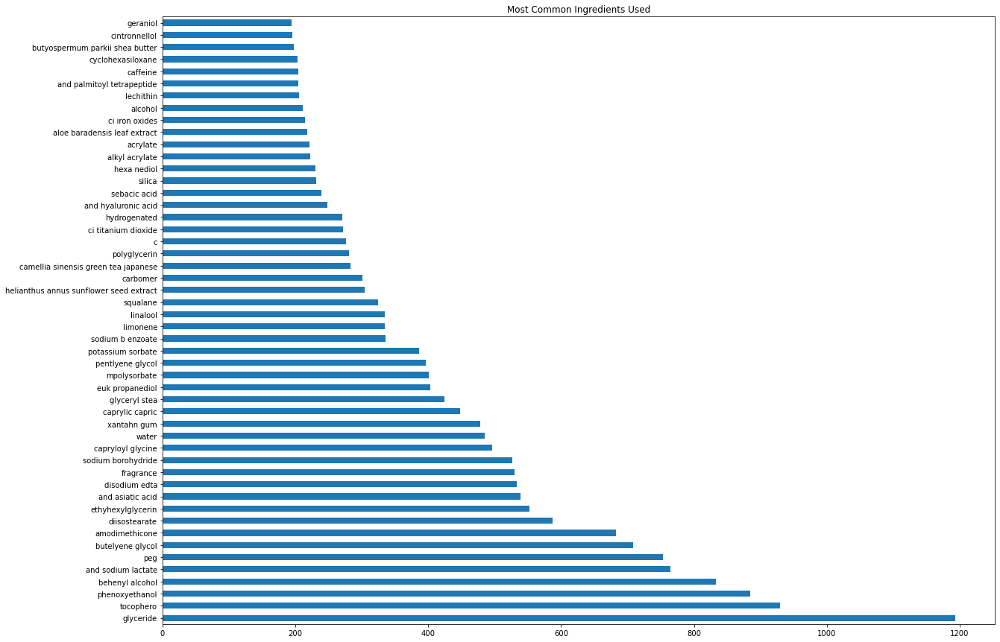

In [80]:
# Plot most common ingredient used chart
plt.figure(figsize=(20,15))
(ingr_count.sum().sort_values(ascending=False)[:50]).plot.barh()
plt.title('Most Common Ingredients Used')

# Save plot
plt.savefig('../plots/most_common_ingr.png', dpi=150, bbox_inches='tight')

In [81]:
# Append product name to ingr_count for reference
ingr_count_df = df[['product_name']].join(ingr_count)

In [82]:
# Save data
ingr_count_df.to_csv('../data/ingr_count.csv', index = False)